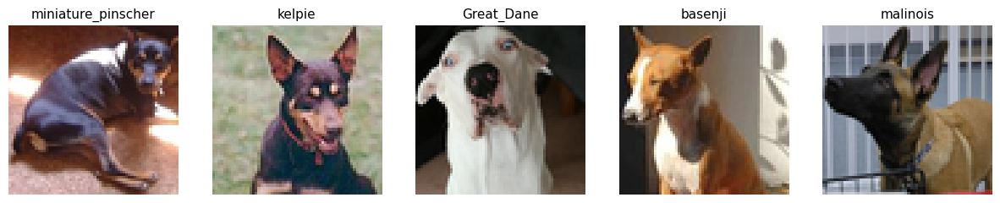

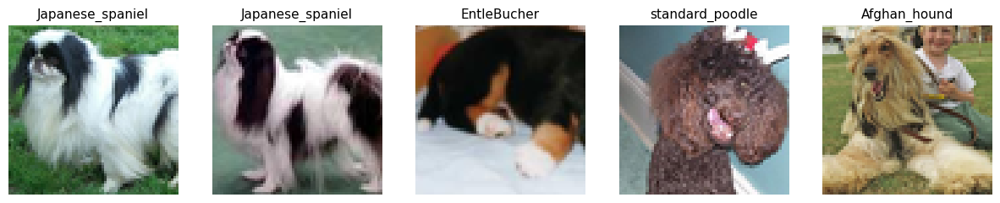

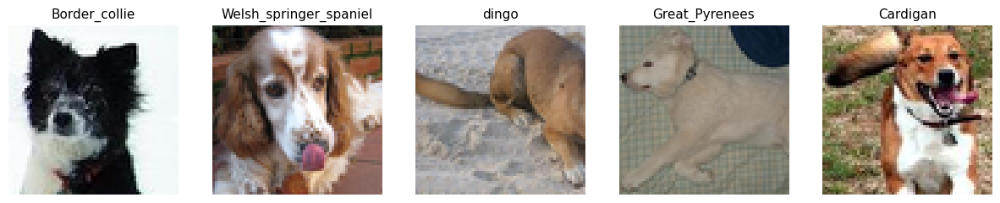

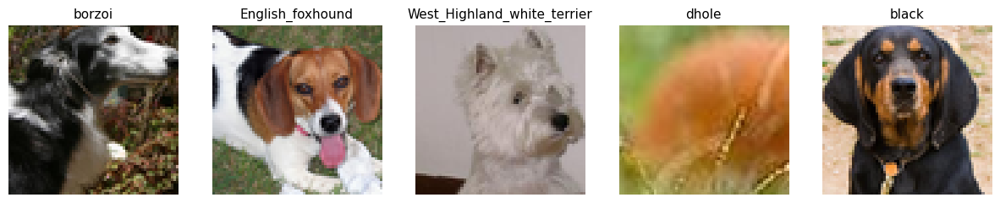

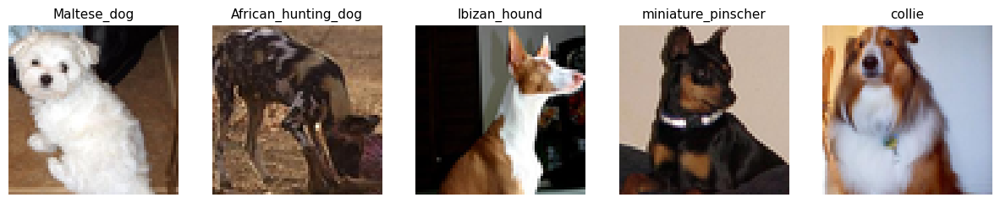

In [2]:
ComputeLB = True
DogsOnly = True

import numpy as np, pandas as pd, os
import xml.etree.ElementTree as ET 
import matplotlib.pyplot as plt, zipfile 
from PIL import Image 

ROOT = '../input/stanford-dog-dataset/'
if not ComputeLB: ROOT = '../input/'
IMAGES = os.listdir(ROOT + 'all-dogs/all-dogs/')
breeds = os.listdir(ROOT + 'Annotation/Annotation/') 

idxIn = 0; namesIn = []
imagesIn = np.zeros((25000,64,64,3))

# CROP WITH BOUNDING BOXES TO GET DOGS ONLY
# https://www.kaggle.com/paulorzp/show-annotations-and-breeds
if DogsOnly:
    for breed in breeds:
        for dog in os.listdir(ROOT+'Annotation/Annotation/'+breed):
            try: img = Image.open(ROOT+'all-dogs/all-dogs/'+dog+'.jpg') 
            except: continue           
            tree = ET.parse(ROOT+'Annotation/Annotation/'+breed+'/'+dog)
            root = tree.getroot()
            objects = root.findall('object')
            for o in objects:
                bndbox = o.find('bndbox') 
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                w = np.min((xmax - xmin, ymax - ymin))
                img2 = img.crop((xmin, ymin, xmin+w, ymin+w))
                img2 = img2.resize((64,64), Image.ANTIALIAS)
                imagesIn[idxIn,:,:,:] = np.asarray(img2)
                #if idxIn%1000==0: print(idxIn)
                namesIn.append(breed)
                idxIn += 1
    idx = np.arange(idxIn)
    np.random.shuffle(idx)
    imagesIn = imagesIn[idx,:,:,:]
    namesIn = np.array(namesIn)[idx]
    
# RANDOMLY CROP FULL IMAGES
else:
    x = np.random.choice(np.arange(20579),10000)
    for k in range(len(x)):
        img = Image.open(ROOT + 'all-dogs/all-dogs/' + IMAGES[x[k]])
        w = img.size[0]
        h = img.size[1]
        sz = np.min((w,h))
        a=0; b=0
        if w<h: b = (h-sz)//2
        else: a = (w-sz)//2
        img = img.crop((0+a, 0+b, sz+a, sz+b))  
        img = img.resize((64,64), Image.ANTIALIAS)   
        imagesIn[idxIn,:,:,:] = np.asarray(img)
        namesIn.append(IMAGES[x[k]])
        if idxIn%1000==0: print(idxIn)
        idxIn += 1
    
# DISPLAY CROPPED IMAGES
x = np.random.randint(0,idxIn,25)
for k in range(5):
    plt.figure(figsize=(15,3))
    for j in range(5):
        plt.subplot(1,5,j+1)
        img = Image.fromarray( imagesIn[x[k*5+j],:,:,:].astype('uint8') )
        plt.axis('off')
        if not DogsOnly: plt.title(namesIn[x[k*5+j]],fontsize=11)
        else: plt.title(namesIn[x[k*5+j]].split('-')[1],fontsize=11)
        plt.imshow(img)
    plt.show()

In [3]:
from keras.models import Model
from keras.layers import Input, Dense, Conv2D, Reshape, Flatten, concatenate, UpSampling2D, LeakyReLU
from keras.utils import image_dataset_from_directory as ImageDataGenerator
from keras.callbacks import LearningRateScheduler
from keras.optimizers import SGD, Adam

2024-04-21 04:07:04.428148: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-21 04:07:04.428256: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-21 04:07:04.552896: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# **EDITS IN BELOW CODE CELL:**

In [4]:
# BUILD DISCRIMINATIVE NETWORK
dog = Input((12288,))
dogName = Input((10000,))

#### EDITS BELOW (use relu instead of sigmoid to avoid vanishing gradients):
# x = Dense(12288, activation='sigmoid')(dogName) ---> output file ---> images1.zip
x = Dense(12288, activation='leaky_relu')(dogName) # ---> output file ---> images2.zip

x = Reshape((2,12288,1))(concatenate([dog,x]))
x = Conv2D(1,(2,1),use_bias=False,name='conv')(x)

# #### EDITS BELOW give OOM error due to large number of params (increase complexity of model with added Conv layers):
# x = Conv2D(16, (3, 3), padding='same')(x) # ---> output file ---> images2.zip
# x = LeakyReLU()(x)                        # ---> output file ---> images2.zip
# x = Conv2D(32, (3, 3), padding='same')(x) # ---> output file ---> images2.zip
# x = LeakyReLU()(x)                        # ---> output file ---> images2.zip
# x = Conv2D(64, (3, 3), padding='same')(x) # ---> output file ---> images2.zip
# x = LeakyReLU()(x)                        # ---> output file ---> images2.zip
# x = Conv2D(1, (1, 1), padding='valid')(x) # ---> output file ---> images2.zip

discriminated = Flatten()(x)

# COMPILE
discriminator = Model([dog,dogName], discriminated)
discriminator.get_layer('conv').trainable = False
discriminator.get_layer('conv').set_weights([np.array([[[[-1.0 ]]],[[[1.0]]]])])
discriminator.compile(optimizer='adam', loss='binary_crossentropy')

# DISPLAY ARCHITECTURE
discriminator.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 10000)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer         │ (None, 12288)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 12288)     │ 122,892,2… │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 24576)     │          0 │ input_layer[0][0… │
│ (Concatenate)       │                   │            │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 2, 12288,  │          0 │ concatenate[0][0] │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv (Conv2D)       │ (None, 1, 12288,  │          2 │ reshape[0][0]     │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 12288)     │          0 │ conv[0][0]        │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 122,892,290 (468.80 MB)

 Trainable params: 122,892,288 (468.80 MB)

 Non-trainable params: 2 (8.00 B)

In [5]:
# TRAINING DATA
train_y = (imagesIn[:10000,:,:,:]/255.).reshape((-1,12288))
train_X = np.zeros((10000,10000))
for i in range(10000): train_X[i,i] = 1
zeros = np.zeros((10000,12288))

# TRAIN NETWORK
lr = 0.5
for k in range(5):
    annealer = LearningRateScheduler(lambda x: lr)
    h = discriminator.fit([zeros,train_X], train_y, epochs = 10, batch_size=256, callbacks=[annealer], verbose=0)
    print('Epoch',(k+1)*10,'/30 - loss =',h.history['loss'][-1] )
    if h.history['loss'][-1]<0.533: lr = 0.1

I0000 00:00:1713672443.015152      87 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1713672445.406632      88 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Epoch 10 /30 - loss = 9.051525115966797
Epoch 20 /30 - loss = 9.046552658081055
Epoch 30 /30 - loss = 9.037528991699219
Epoch 40 /30 - loss = 9.04626178741455
Epoch 50 /30 - loss = 9.03569507598877


In [6]:
del train_X, train_y, imagesIn

Discriminator Recalls from Memory Dogs
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


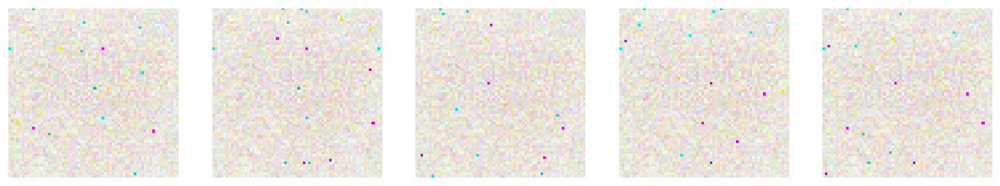

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


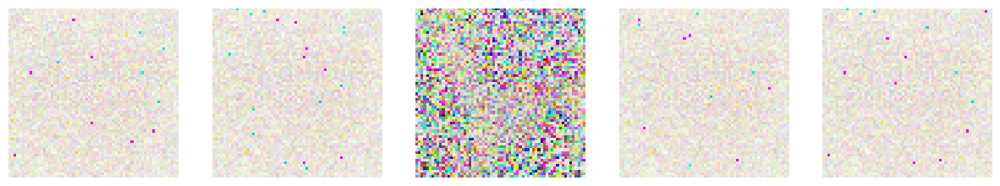

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


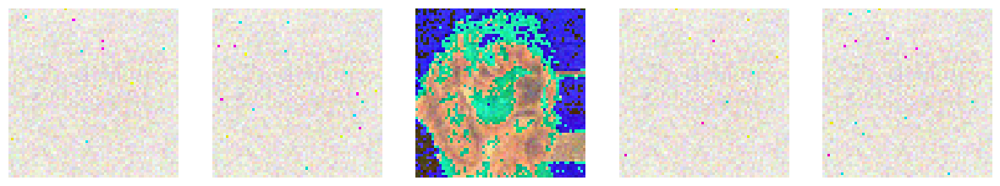

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


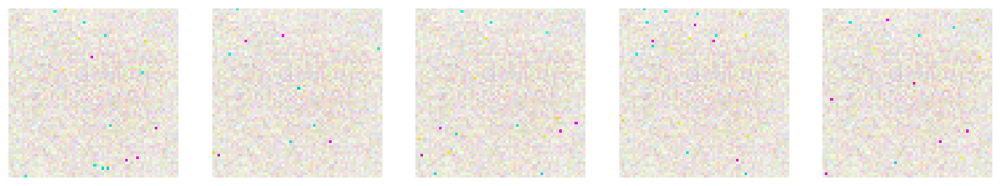

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


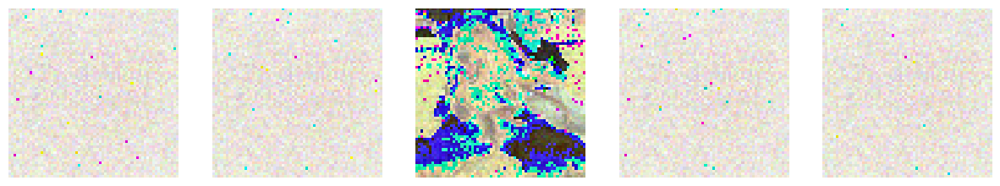

In [7]:
print('Discriminator Recalls from Memory Dogs')    
for k in range(5):
    plt.figure(figsize=(15,3))
    for j in range(5):
        xx = np.zeros((10000))
        xx[np.random.randint(10000)] = 1
        plt.subplot(1,5,j+1)
        img = discriminator.predict([zeros[0,:].reshape((-1,12288)),xx.reshape((-1,10000))]).reshape((-1,64,64,3))
        img = Image.fromarray( (255*img).astype('uint8').reshape((64,64,3)))
        plt.axis('off')
        plt.imshow(img)
    plt.show()

In [8]:
# BUILD GENERATOR NETWORK
BadMemory = True

if BadMemory:
    seed = Input((10000,))
    x = Dense(2048, activation='elu')(seed)
    x = Reshape((8,8,32))(x)
    x = Conv2D(128, (3, 3), activation='elu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='elu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(32, (3, 3), activation='elu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(3, (3, 3), activation='linear', padding='same')(x)
    generated = Flatten()(x)
else:
    seed = Input((10000,))
    generated = Dense(12288, activation='linear')(seed)

# COMPILE
generator = Model(seed, [generated,Reshape((10000,))(seed)])

# DISPLAY ARCHITECTURE
generator.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 10000)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 2048)      │ 20,482,048 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_1 (Reshape) │ (None, 8, 8, 32)  │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 8, 8, 128) │     36,992 │ reshape_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 16, 16,    │          0 │ conv2d[0][0]      │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 16, 16,    │     73,792 │ up_sampling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 32, 32,    │          0 │ conv2d_1[0][0]    │
│ (UpSampling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 32, 32,    │     18,464 │ up_sampling2d_1[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 64, 64,    │          0 │ conv2d_2[0][0]    │
│ (UpSampling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64, 3) │        867 │ up_sampling2d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_1 (Flatten) │ (None, 12288)     │          0 │ conv2d_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_2 (Reshape) │ (None, 10000)     │          0 │ input_layer_2[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 20,612,163 (78.63 MB)

 Trainable params: 20,612,163 (78.63 MB)

 Non-trainable params: 0 (0.00 B)

In [9]:
discriminator.trainable = False

# Set up GAN input and output
gan_input = Input(shape=(10000,))
x = generator(gan_input)
gan_output = discriminator(x)

# Compile GAN
gan = Model(inputs=gan_input, outputs=gan_output)

# Display architecture to check layer names and configurations
gan.summary()

# Example: Set weights to a layer (adjust 'layer_name' and weights array as per your actual model)
# layer_name should be replaced with the actual name of the layer you want to set weights for
# Check from gan.summary() and ensure the weight array shape matches the layer's weights shape
layer_name = 'layer_name'  # Replace 'layer_name' with the actual layer name
if layer_name in [layer.name for layer in gan.layers]:
    gan.get_layer(layer_name).set_weights([np.random.rand(*shape) for shape in gan.get_layer(layer_name).get_weights_shape()])
else:
    print("Layer not found")

# Compile the model with an appropriate learning rate
gan.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 10000)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_3        │ [(None, 12288),   │ 20,612,163 │ input_layer_3[0]… │
│ (Functional)        │ (None, 10000)]    │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_1        │ (None, 12288)     │ 122,892,2… │ functional_3[0][… │
│ (Functional)        │                   │            │ functional_3[0][… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 143,504,453 (547.43 MB)

 Trainable params: 20,612,163 (78.63 MB)

 Non-trainable params: 122,892,290 (468.80 MB)

Layer not found


In [10]:
# BUILD GENERATIVE ADVERSARIAL NETWORK
discriminator.trainable=False    
gan_input = Input(shape=(10000,))
x = generator(gan_input)
gan_output = discriminator(x)


# # DISPLAY ARCHITECTURE
gan.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 10000)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_3        │ [(None, 12288),   │ 20,612,163 │ input_layer_3[0]… │
│ (Functional)        │ (None, 10000)]    │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_1        │ (None, 12288)     │ 122,892,2… │ functional_3[0][… │
│ (Functional)        │                   │            │ functional_3[0][… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 143,504,453 (547.43 MB)

 Trainable params: 20,612,163 (78.63 MB)

 Non-trainable params: 122,892,290 (468.80 MB)

In [11]:
from keras.optimizers import Adam  

In [12]:
# COMPILE GAN
gan = Model(gan_input, gan_output)
gan.get_layer('functional_1').get_layer('conv').set_weights([np.array([[[[-1 ]]],[[[255.]]]])])
# gan.compile(optimizer=Adam(5), loss='mean_squared_error')
gan.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

In [13]:
# # DISPLAY ARCHITECTURE
gan.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 10000)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_3        │ [(None, 12288),   │ 20,612,163 │ input_layer_4[0]… │
│ (Functional)        │ (None, 10000)]    │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_1        │ (None, 12288)     │ 122,892,2… │ functional_3[1][… │
│ (Functional)        │                   │            │ functional_3[1][… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 143,504,453 (547.43 MB)

 Trainable params: 20,612,163 (78.63 MB)

 Non-trainable params: 122,892,290 (468.80 MB)

W0000 00:00:1713672895.069076      87 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1713672899.746405      87 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Epoch 1 /9 - loss = 161103.46875
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


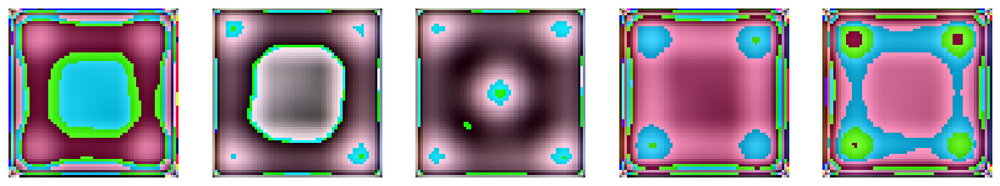

Epoch 2 /9 - loss = 19937.11328125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


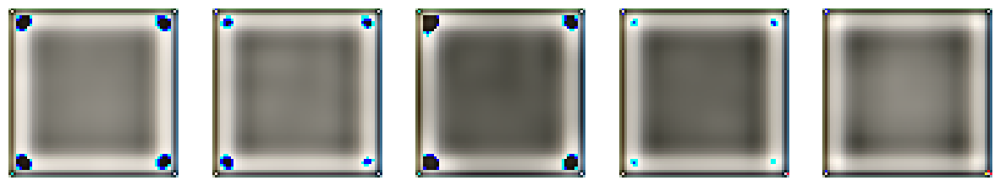

Epoch 3 /9 - loss = 5793.6865234375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


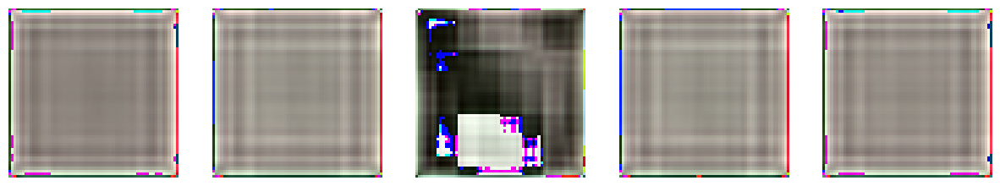

Epoch 4 /9 - loss = 3271.225830078125
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


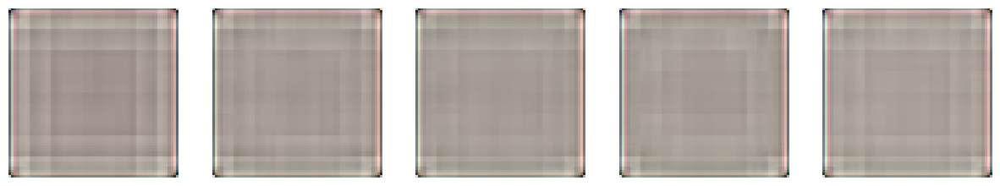

Epoch 5 /9 - loss = 6024.94921875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


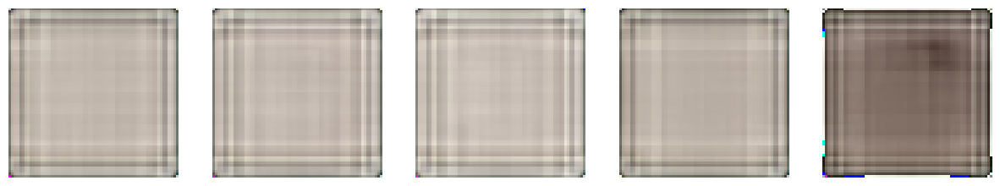

Epoch 6 /9 - loss = 2911.141357421875
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


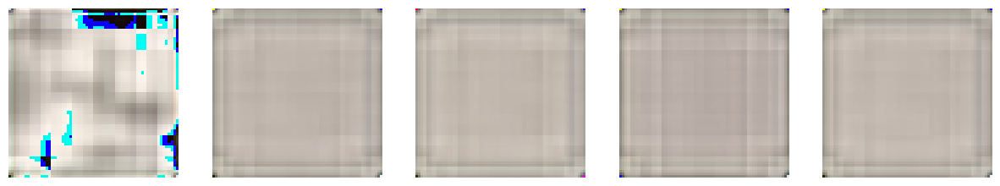

Epoch 7 /9 - loss = 2738.81005859375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


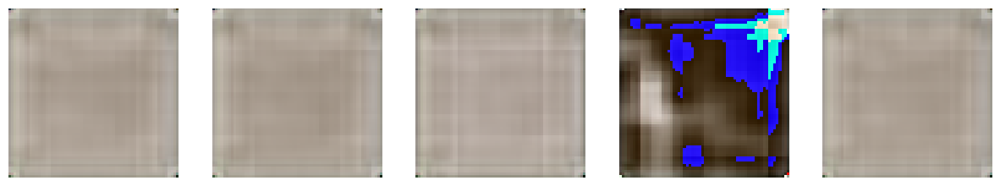

Epoch 8 /9 - loss = 2645.420166015625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


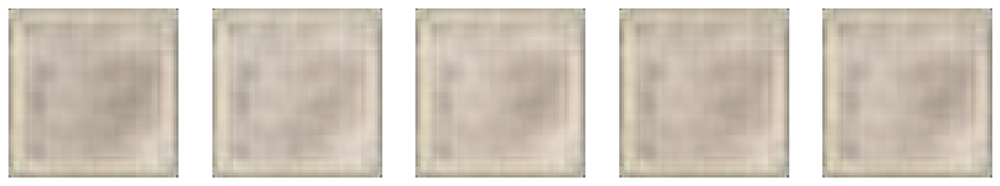

Epoch 9 /9 - loss = 2490.52880859375
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


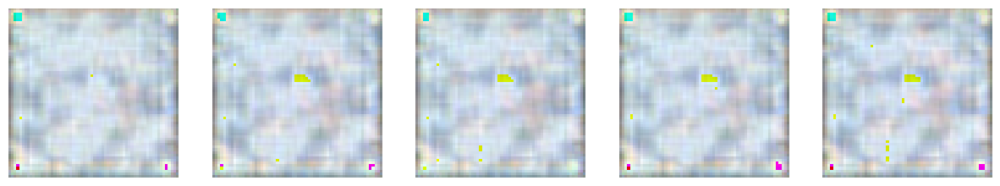

In [14]:
# TRAINING DATA
train = np.zeros((10000,10000))
for i in range(10000): train[i,i] = 1
zeros = np.zeros((10000,12288))

# TRAIN NETWORKS
ep = 1; it = 9
if BadMemory: lr = 0.005
else: lr = 5.
    
for k in range(it):  

    # BEGIN DISCRIMINATOR COACHES GENERATOR
    annealer = LearningRateScheduler(lambda x: lr)
    h = gan.fit(train, zeros, epochs = ep, batch_size=256, callbacks=[annealer], verbose=0)

    # DISPLAY GENERATOR LEARNING PROGRESS 
    print('Epoch',(k+1),'/'+str(it)+' - loss =',h.history['loss'][-1] )
    plt.figure(figsize=(15,3))
    for j in range(5):
        xx = np.zeros((10000))
        xx[np.random.randint(10000)] = 1
        plt.subplot(1,5,j+1)
        img = generator.predict(xx.reshape((-1,10000)))[0].reshape((-1,64,64,3))
        img = Image.fromarray( (img).astype('uint8').reshape((64,64,3)))
        plt.axis('off')
        plt.imshow(img)
    plt.show()  
            
    # ADJUST LEARNING RATES
    if BadMemory:
        ep *= 2
        if ep>=32: lr = 0.001
        if ep>256: ep = 256
    else:
        if h.history['loss'][-1] < 25: lr = 1.
        if h.history['loss'][-1] < 1.5: lr = 0.5

In [15]:
#g

In [15]:
class DogGenerator:
    index = 0   
    def getDog(self,seed):
        xx = np.zeros((10000))
        xx[self.index] = 0.70
        xx[np.random.randint(10000)] = 0.30
        img = generator.predict(xx.reshape((-1,10000)))[0].reshape((64,64,3))
        self.index = (self.index+1)%10000
        return Image.fromarray( img.astype('uint8') ) 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


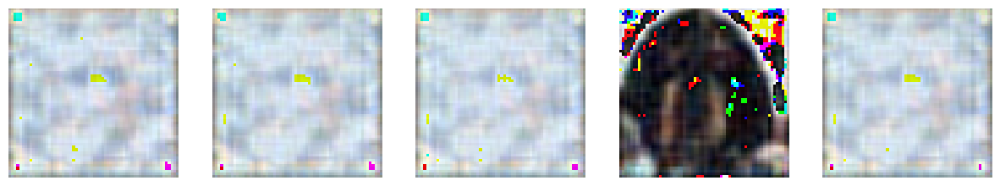

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


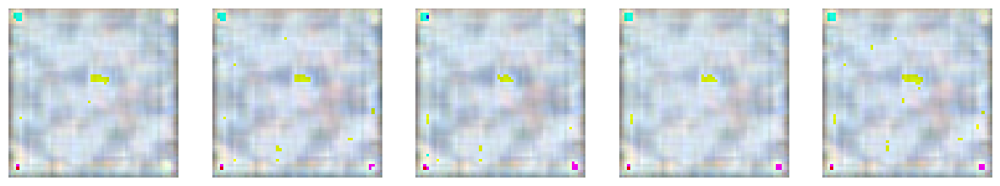

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


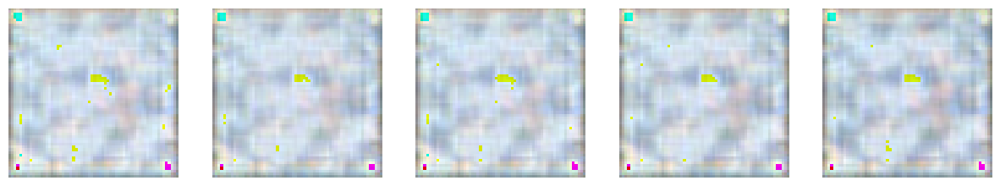

In [16]:
# DISPLAY EXAMPLE DOGS
d = DogGenerator()
for k in range(3):
    plt.figure(figsize=(15,3))
    for j in range(5):
        plt.subplot(1,5,j+1)
        img = d.getDog(np.random.normal(0,1,100))
        plt.axis('off')
        plt.imshow(img)
    plt.show() 

In [17]:
# SAVE TO ZIP FILE NAMED IMAGES.ZIP
z = zipfile.PyZipFile('images2.zip', mode='w')
d = DogGenerator()
for k in range(100):
    img = d.getDog(np.random.normal(0,1,100))
    f = str(k)+'.png'
    img.save(f,'PNG'); z.write(f); os.remove(f)
    #if k % 1000==0: print(k)
z.close()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━

#albumentations:

A fast and flexible image augmentation library designed to work with very large images and supports various tasks like classification, segmentation, and detection.
glob:

A library that finds all the pathnames matching a specified pattern according to the rules used by the Unix shell, although results are returned in arbitrary order.
xml.etree.ElementTree (ET):

A library for parsing and creating XML data. It's lightweight and efficient, making it ideal for XML manipulation tasks.
shutil:

Provides high-level file operations such as copying and removal of files or directories.


In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import numpy as np
import torch
from torch import nn, optim
from torch import autograd
import torch.nn.functional as F
from torch.nn import Parameter
from torchvision import datasets, transforms
from torchvision.utils import save_image
from torch.utils.data import Dataset,DataLoader,Subset
from PIL import Image,ImageOps,ImageEnhance

import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2

import glob
import xml.etree.ElementTree as ET #for parsing XML
import shutil
from tqdm import tqdm
import time
import random

In [2]:
import os
print(os.listdir("../input"))

['stanford-dog-dataset']


In [3]:
TIME_LIMIT = 32400 - 60*10
start_time = time.time()
def elapsed_time(start_time):
    return time.time() - start_time

In [4]:
#random seeds
seed = 2019
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

BATCH_SIZE  = 32
NUM_WORKERS = 4
EMA = False
LABEL_NOISE = False
LABEL_NOISE_PROB = 0.1

BATCH_SIZE = 32:

Defines the batch size as 32. In machine learning, especially in training neural networks, the dataset is divided into "batches" that are processed iteratively. A batch size of 32 means that 32 data points (e.g., images, records) are processed at a time during training.
NUM_WORKERS = 4:

Specifies the number of worker processes used for loading data. Having multiple workers allows for parallel data loading, which can speed up the process especially when dealing with large datasets and complex transformations.
EMA = False:

Stands for Exponential Moving Average. Here, it's a Boolean flag (set to False), possibly used to determine whether or not to use EMA as a part of the training process. EMA can be used for smoothing the training parameters to stabilize the training process.
LABEL_NOISE = False:

Indicates whether label noise should be introduced into the dataset. Label noise refers to errors in the dataset's labels, and introducing it can sometimes help to improve the robustness of the model by simulating inaccuracies that might occur in real-world data.
LABEL_NOISE_PROB = 0.1:

This sets the probability (10%) at which label noise is applied, assuming LABEL_NOISE is True. It’s a parameter that controls how often an incorrect label might be substituted for the correct label during training.

In [5]:
PATH = '../input/stanford-dog-dataset/all-dogs/all-dogs/'
img_filenames = os.listdir(PATH)
len(img_filenames)

20579

In [6]:
PATH_ANNOTATION = '../input/stanford-dog-dataset/Annotation/Annotation/'
breeds = glob.glob(PATH_ANNOTATION+'*')
annotations = []
for breed in breeds:
    annotations += glob.glob(breed+'/*')
len(annotations)

20580

In [7]:
breed_map = {}
for annotation in annotations:
    breed = annotation.split('/')[-2]
    index = breed.split('-')[0]
    breed_map.setdefault(index,breed)
n_classes = len(breed_map)
n_classes

120

In [8]:
breed_map

{'n02091635': 'n02091635-otterhound',
 'n02102318': 'n02102318-cocker_spaniel',
 'n02101388': 'n02101388-Brittany_spaniel',
 'n02088094': 'n02088094-Afghan_hound',
 'n02085936': 'n02085936-Maltese_dog',
 'n02104365': 'n02104365-schipperke',
 'n02100877': 'n02100877-Irish_setter',
 'n02086079': 'n02086079-Pekinese',
 'n02099601': 'n02099601-golden_retriever',
 'n02100583': 'n02100583-vizsla',
 'n02102177': 'n02102177-Welsh_springer_spaniel',
 'n02093256': 'n02093256-Staffordshire_bullterrier',
 'n02106166': 'n02106166-Border_collie',
 'n02093991': 'n02093991-Irish_terrier',
 'n02109961': 'n02109961-Eskimo_dog',
 'n02110958': 'n02110958-pug',
 'n02105412': 'n02105412-kelpie',
 'n02094433': 'n02094433-Yorkshire_terrier',
 'n02097474': 'n02097474-Tibetan_terrier',
 'n02089867': 'n02089867-Walker_hound',
 'n02110627': 'n02110627-affenpinscher',
 'n02113186': 'n02113186-Cardigan',
 'n02102040': 'n02102040-English_springer',
 'n02089973': 'n02089973-English_foxhound',
 'n02098286': 'n02098286

In [9]:
#https://www.kaggle.com/whizzkid/crop-images-using-bounding-box
def bounding_box(img):
    bpath = PATH_ANNOTATION + str(breed_map[img.split('_')[0]])+'/'+str(img.split('.')[0])
    tree  = ET.parse(bpath)
    root  = tree.getroot()
    objects = root.findall('object')
    bbxs = []
    for o in objects:
        bndbox = o.find('bndbox') #reading bound box
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
        bbxs.append((xmin,ymin,xmax,ymax))
    return bbxs

bpath = PATH_ANNOTATION + str(breed_map[img.split('_')[0]]) + '/' + str(img.split('.')[0]):

PATH_ANNOTATION is presumably a predefined constant that holds the path to the directory where the XML files containing bounding box data are stored.
breed_map appears to be a dictionary that maps a part of the image file name (specifically the prefix before the first underscore _) to a breed or category. This segment of the filename is extracted using img.split('_')[0].
img.split('.')[0] takes the filename (img) and splits it by the period (.), selecting the first part to discard the file extension. This might represent a specific annotation file for the image.
The complete path (bpath) combines these elements to point to the specific XML file for the given image.
tree = ET.parse(bpath):

Uses Python’s xml.etree.ElementTree module to parse the XML file located at the path bpath. The result, tree, is an ElementTree object that represents the XML document in a tree structure.
root = tree.getroot():

Retrieves the root element of the XML tree. This is the top-level element of the XML structure, typically containing all other elements.
objects = root.findall('object'):

Finds all sub-elements named 'object' under the root. These ‘object’ elements usually represent individual objects within the image, each possibly having a bounding box.
bbxs = []:

Initializes an empty list bbxs to store the bounding box coordinates for each object found in the XML file.
for o in objects:

Iterates over each object found in the XML document.
a. bndbox = o.find('bndbox'):

Finds the first sub-element named 'bndbox' within the object element. This 'bndbox' typically contains the coordinates of the bounding box.
b. xmin, ymin, xmax, ymax:

Retrieves the text inside the xmin, ymin, xmax, and ymax sub-elements of the 'bndbox' element and converts them to integers. These represent the coordinates of the bounding box:
xmin and ymin represent the top-left corner of the rectangle.
xmax and ymax represent the bottom-right corner of the rectangle.
c. bbxs.append((xmin,ymin,xmax,ymax)):

Appends a tuple containing the coordinates of the bounding box to the bbxs list.
Return Statement
return bbxs:
After all objects have been processed, the function returns the list of bounding boxes as tuples of coordinates.
This function is crucial for applications where precise location data about objects within images is necessary, such as in training data preparation for object detection models.

In [10]:
def bounding_box_ratio(img):
    bpath = PATH_ANNOTATION + str(breed_map[img.split('_')[0]])+'/'+str(img.split('.')[0])
    tree  = ET.parse(bpath)
    root  = tree.getroot()
    objects = root.findall('object')
    bbx_ratios = []
    for o in objects:
        bndbox = o.find('bndbox') #reading bound box
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)
        xlen = xmax - xmin
        ylen = ymax - ymin
        ratio = ylen / xlen
        bbx_ratios.append((xlen,ylen,ratio))
    return bbx_ratios

In [11]:
%%time
#threshold for aspect ratio, at the same time idx for each bbx
img_filenames_th = []
ratios_th = []
for img in tqdm(img_filenames):
    bbx_ratios = bounding_box_ratio(img)
    for i,(xlen,ylen,ratio) in enumerate(bbx_ratios):
        if ((ratio>0.2)&(ratio<4.0)):
            img_filenames_th.append(img[:-4]+'_'+str(i)+'.jpg')
            ratios_th.append(ratio)
ratios_th = np.array(ratios_th)

print('original : ', len(img_filenames))
print('after th : ', len(img_filenames_th))

100%|██████████| 20579/20579 [00:43<00:00, 468.97it/s]

original :  20579
after th :  22119
CPU times: user 2.78 s, sys: 1.63 s, total: 4.41 s
Wall time: 43.9 s


In [12]:
#from https://www.kaggle.com/korovai/dogs-images-intruders-extraction
intruders = [
    #n02088238-basset
    'n02088238_10870_0.jpg',
    
    #n02088466-bloodhound
    'n02088466_6901_1.jpg',
    'n02088466_6963_0.jpg',
    'n02088466_9167_0.jpg',
    'n02088466_9167_1.jpg',
    'n02088466_9167_2.jpg',
    
    #n02089867-Walker_hound
    'n02089867_2221_0.jpg',
    'n02089867_2227_1.jpg',
    
    #n02089973-English_foxhound # No details
    'n02089973_1132_3.jpg',
    'n02089973_1352_3.jpg',
    'n02089973_1458_1.jpg',
    'n02089973_1799_2.jpg',
    'n02089973_2791_3.jpg',
    'n02089973_4055_0.jpg',
    'n02089973_4185_1.jpg',
    'n02089973_4185_2.jpg',
    
    #n02090379-redbone
    'n02090379_4673_1.jpg',
    'n02090379_4875_1.jpg',
    
    #n02090622-borzoi # Confusing
    'n02090622_7705_1.jpg',
    'n02090622_9358_1.jpg',
    'n02090622_9883_1.jpg',
    
    #n02090721-Irish_wolfhound # very small
    'n02090721_209_1.jpg',
    'n02090721_1222_1.jpg',
    'n02090721_1534_1.jpg',
    'n02090721_1835_1.jpg',
    'n02090721_3999_1.jpg',
    'n02090721_4089_1.jpg',
    'n02090721_4276_2.jpg',
    
    #n02091032-Italian_greyhound
    'n02091032_722_1.jpg',
    'n02091032_745_1.jpg',
    'n02091032_1773_0.jpg',
    'n02091032_9592_0.jpg',
    
    #n02091134-whippet
    'n02091134_2349_1.jpg',
    'n02091134_14246_2.jpg',
    
    #n02091244-Ibizan_hound
    'n02091244_583_1.jpg',
    'n02091244_2407_0.jpg',
    'n02091244_3438_1.jpg',
    'n02091244_5639_1.jpg',
    'n02091244_5639_2.jpg',
    
    #n02091467-Norwegian_elkhound
    'n02091467_473_0.jpg',
    'n02091467_4386_1.jpg',
    'n02091467_4427_1.jpg',
    'n02091467_4558_1.jpg',
    'n02091467_4560_1.jpg',
    
    #n02091635-otterhound
    'n02091635_1192_1.jpg',
    'n02091635_4422_0.jpg',
    
    #n02091831-Saluki
    'n02091831_1594_1.jpg',
    'n02091831_2880_0.jpg',
    'n02091831_7237_1.jpg',
    
    #n02092002-Scottish_deerhound
    'n02092002_1551_1.jpg',
    'n02092002_1937_1.jpg',
    'n02092002_4218_0.jpg',
    'n02092002_4596_0.jpg',
    'n02092002_5246_1.jpg',
    'n02092002_6518_0.jpg',
    
    #02093256-Staffordshire_bullterrier
    'n02093256_1826_1.jpg',
    'n02093256_4997_0.jpg',
    'n02093256_14914_0.jpg',
    
    #n02093428-American_Staffordshire_terrier
    'n02093428_5662_0.jpg',
    'n02093428_6949_1.jpg'
            ]

len(intruders)

60

In [13]:
def data_preprocessing(img_path,bbx_idx):
    bbx = bounding_box(img_path)[bbx_idx]
    img  = Image.open(os.path.join(PATH,img_path))#PILImage format
    img_cropped  = img.crop(bbx)
    return img_cropped

In [14]:
%%time
breed_map_2 = {}
for i,b in enumerate(breed_map.keys()):
    breed_map_2[b] = i

CPU times: user 35 µs, sys: 13 µs, total: 48 µs
Wall time: 51.7 µs


In [15]:
class DogDataset(Dataset):
    def __init__(self, path, img_list, transform1=None, transform2=None):
        self.path      = path
        self.img_list  = img_list
        self.transform1 = transform1
        self.transform2 = transform2
        
        self.imgs   = []
        self.labels = []
        for i,full_img_path in enumerate(self.img_list):
            if full_img_path in intruders:
                continue
            #img
            img_path = full_img_path[:-6]+'.jpg'
            bbx_idx  = int(full_img_path[-5])
            img = data_preprocessing(img_path,bbx_idx)
            if self.transform1:
                img = self.transform1(img) #output shape=(ch,h,w)
            self.imgs.append(img)
            #label
            label = breed_map_2[img_path.split('_')[0]]
            self.labels.append(label)
            
    def __len__(self):
        return len(self.imgs)
    
    def __getitem__(self,idx):
        img = self.imgs[idx]
        if self.transform2:
            img = self.transform2(img)
        label = self.labels[idx]
        return {'img':img, 'label':label}

In [16]:
%%time
# generate 64x64 images!
#resize_size = 68
img_size    = 64
batch_size  = BATCH_SIZE
MEAN1,MEAN2,MEAN3 = 0.5, 0.5, 0.5
STD1,STD2,STD3    = 0.5, 0.5, 0.5

transform1 = transforms.Compose([transforms.Resize(img_size)])

transform2 = transforms.Compose([transforms.RandomCrop(img_size),
                                 #transforms.RandomAffine(degrees=5),
                                 transforms.RandomHorizontalFlip(p=0.5),
                                 #transforms.RandomApply(random_transforms, p=0.3),
                                 transforms.ToTensor(),
                                 transforms.Normalize(mean=[MEAN1, MEAN2, MEAN3],
                                                      std=[STD1, STD2, STD3]),
                                ])

train_set = DogDataset(path=PATH,
                       img_list=img_filenames_th,
                       transform1=transform1,
                       transform2=transform2,
                      )

train_loader = DataLoader(train_set,
                          shuffle=True, batch_size=batch_size,
                          num_workers=NUM_WORKERS, pin_memory=True)

CPU times: user 47 s, sys: 3.46 s, total: 50.5 s
Wall time: 2min 7s


In [17]:
len(train_set)

22059

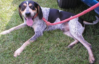

In [18]:
img = data_preprocessing(img_filenames_th[1500][:-6]+'.jpg',0)
img = transform1(img)
img

In [19]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [20]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [21]:
def conv3x3(in_channel, out_channel): #not change resolusion
    return nn.Conv2d(in_channel,out_channel,
                      kernel_size=3,stride=1,padding=1,dilation=1,bias=False)

def conv1x1(in_channel, out_channel): #not change resolution
    return nn.Conv2d(in_channel,out_channel,
                      kernel_size=1,stride=1,padding=0,dilation=1,bias=False)

def init_weight(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.orthogonal_(m.weight, gain=1)
        if m.bias is not None:
            m.bias.data.zero_()
            
    elif classname.find('Batch') != -1:
        m.weight.data.normal_(1,0.02)
        m.bias.data.zero_()
    
    elif classname.find('Linear') != -1:
        nn.init.orthogonal_(m.weight, gain=1)
        if m.bias is not None:
            m.bias.data.zero_()
    
    elif classname.find('Embedding') != -1:
        nn.init.orthogonal_(m.weight, gain=1)
        

# class Attention(nn.Module):
#     def __init__(self, c, h, w):
#         super().__init__()
#         self.attention_fc = nn.Linear(c,1, bias=False).apply(init_weight)
#         self.bias         = nn.Parameter(torch.zeros((1,h,w,1), requires_grad=True))
#         self.sigmoid      = nn.Sigmoid()
        
#     def forward(self,inputs):
#         batch,c,h,w = inputs.size()
#         x = torch.transpose(inputs, 1,2) #(*,c,h,w)->(*,h,c,w)
#         x = torch.transpose(x, 2,3) #(*,h,c,w)->(*,h,w,c)
#         x = self.attention_fc(x) + self.bias
#         x = torch.transpose(x, 2,3) #(*,h,w,1)->(*,h,1,w)
#         x = torch.transpose(x, 1,2) #(*,h,1,w)->(*,1,h,w)
#         x = self.sigmoid(x)
#         return inputs * x

class Attention(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.channels = channels
        self.theta    = nn.utils.spectral_norm(conv1x1(channels, channels//8)).apply(init_weight)
        self.phi      = nn.utils.spectral_norm(conv1x1(channels, channels//8)).apply(init_weight)
        self.g        = nn.utils.spectral_norm(conv1x1(channels, channels//2)).apply(init_weight)
        self.o        = nn.utils.spectral_norm(conv1x1(channels//2, channels)).apply(init_weight)
        self.gamma    = nn.Parameter(torch.tensor(0.), requires_grad=True)
        
    def forward(self, inputs):
        batch,c,h,w = inputs.size()
        theta = self.theta(inputs) #->(*,c/8,h,w)
        phi   = F.max_pool2d(self.phi(inputs), [2,2]) #->(*,c/8,h/2,w/2)
        g     = F.max_pool2d(self.g(inputs), [2,2]) #->(*,c/2,h/2,w/2)
        
        theta = theta.view(batch, self.channels//8, -1) #->(*,c/8,h*w)
        phi   = phi.view(batch, self.channels//8, -1) #->(*,c/8,h*w/4)
        g     = g.view(batch, self.channels//2, -1) #->(*,c/2,h*w/4)
        
        beta = F.softmax(torch.bmm(theta.transpose(1,2), phi), -1) #->(*,h*w,h*w/4)
        o    = self.o(torch.bmm(g, beta.transpose(1,2)).view(batch,self.channels//2,h,w)) #->(*,c,h,w)
        return self.gamma*o + inputs
        
    
class ConditionalNorm(nn.Module):
    def __init__(self, in_channel, n_condition):
        super().__init__()
        self.bn = nn.BatchNorm2d(in_channel, affine=False) #no learning parameters
        self.embed = nn.Linear(n_condition, in_channel* 2)
        
        nn.init.orthogonal_(self.embed.weight.data[:, :in_channel], gain=1)
        self.embed.weight.data[:, in_channel:].zero_()

    def forward(self, inputs, label):
        out = self.bn(inputs)
        embed = self.embed(label.float())
        gamma, beta = embed.chunk(2, dim=1)
        gamma = gamma.unsqueeze(2).unsqueeze(3)
        beta = beta.unsqueeze(2).unsqueeze(3)
        out = gamma * out + beta
        return out

# **BIG GAN + LEAKY RELU**

In [22]:
#BigGAN + leaky_relu           
class ResBlock_G(nn.Module):
    def __init__(self, in_channel, out_channel, condition_dim, upsample=True):
        super().__init__()
        self.cbn1 = ConditionalNorm(in_channel, condition_dim)
        self.upsample = nn.Sequential()
        if upsample:
            self.upsample.add_module('upsample',nn.Upsample(scale_factor=2, mode='nearest'))
        self.conv3x3_1 = nn.utils.spectral_norm(conv3x3(in_channel, out_channel)).apply(init_weight)
        self.cbn2 = ConditionalNorm(out_channel, condition_dim)
        self.conv3x3_2 = nn.utils.spectral_norm(conv3x3(out_channel, out_channel)).apply(init_weight) 
        self.conv1x1   = nn.utils.spectral_norm(conv1x1(in_channel, out_channel)).apply(init_weight)
        
    def forward(self, inputs, condition):
        x  = F.leaky_relu(self.cbn1(inputs, condition))
        x  = self.upsample(x)
        x  = self.conv3x3_1(x)
        x  = self.conv3x3_2(F.leaky_relu(self.cbn2(x, condition)))
        x += self.conv1x1(self.upsample(inputs)) #shortcut
        return x

class Generator(nn.Module):
    def __init__(self, n_feat, codes_dim=24, n_classes=n_classes):
        super().__init__()
        self.fc   = nn.Sequential(
            nn.utils.spectral_norm(nn.Linear(codes_dim, 16*n_feat*4*4)).apply(init_weight)
        )
        self.res1 = ResBlock_G(16*n_feat, 16*n_feat, codes_dim+n_classes, upsample=True)
        self.res2 = ResBlock_G(16*n_feat,  8*n_feat, codes_dim+n_classes, upsample=True)
        #self.attn2 = Attention(8*n_feat)
        self.res3 = ResBlock_G( 8*n_feat,  4*n_feat, codes_dim+n_classes, upsample=True)
        self.attn = Attention(4*n_feat)
        self.res4 = ResBlock_G( 4*n_feat,  2*n_feat, codes_dim+n_classes, upsample=True)
        self.conv = nn.Sequential(
            #nn.BatchNorm2d(2*n_feat).apply(init_weight),
            nn.LeakyReLU(),
            nn.utils.spectral_norm(conv3x3(2*n_feat, 3)).apply(init_weight),
        )
        
    def forward(self, z, label_ohe, codes_dim=24):
        '''
        z.shape = (*,120)
        label_ohe.shape = (*,n_classes)
        '''
        batch = z.size(0)
        z = z.squeeze()
        label_ohe = label_ohe.squeeze()
        codes = torch.split(z, codes_dim, dim=1)
        
        x = self.fc(codes[0]) #->(*,16ch*4*4)
        x = x.view(batch,-1,4,4) #->(*,16ch,4,4)
        
        condition = torch.cat([codes[1], label_ohe], dim=1) #(*,codes_dim+n_classes)
        x = self.res1(x, condition)#->(*,16ch,8,8)
        
        condition = torch.cat([codes[2], label_ohe], dim=1)
        x = self.res2(x, condition) #->(*,8ch,16,16)
        #x = self.attn2(x) #not change shape
        
        condition = torch.cat([codes[3], label_ohe], dim=1)
        x = self.res3(x, condition) #->(*,4ch,32,32)
        x = self.attn(x) #not change shape
        
        condition = torch.cat([codes[4], label_ohe], dim=1)
        x = self.res4(x, condition) #->(*,2ch,64,64)
        
        x = self.conv(x) #->(*,3,64,64)
        x = torch.tanh(x)
        return x
    

class ResBlock_D(nn.Module):
    def __init__(self, in_channel, out_channel, downsample=True):
        super().__init__()
        self.layer = nn.Sequential(
            nn.LeakyReLU(0.2),
            nn.utils.spectral_norm(conv3x3(in_channel, out_channel)).apply(init_weight),
            nn.LeakyReLU(0.2),
            nn.utils.spectral_norm(conv3x3(out_channel, out_channel)).apply(init_weight),
        )
        self.shortcut = nn.Sequential(
            nn.utils.spectral_norm(conv1x1(in_channel,out_channel)).apply(init_weight),
        )
        if downsample:
            self.layer.add_module('avgpool',nn.AvgPool2d(kernel_size=2,stride=2))
            self.shortcut.add_module('avgpool',nn.AvgPool2d(kernel_size=2,stride=2))
        
    def forward(self, inputs):
        x  = self.layer(inputs)
        x += self.shortcut(inputs)
        return x
    

class Discriminator(nn.Module):
    def __init__(self, n_feat, n_classes=n_classes):
        super().__init__()
        self.res1 = ResBlock_D(3, n_feat, downsample=True)
        self.attn = Attention(n_feat)
        self.res2 = ResBlock_D(  n_feat, 2*n_feat, downsample=True)
        #self.attn2 = Attention(2*n_feat)
        self.res3 = ResBlock_D(2*n_feat, 4*n_feat, downsample=True)
        self.res4 = ResBlock_D(4*n_feat, 8*n_feat, downsample=True)
        self.res5 = ResBlock_D(8*n_feat,16*n_feat, downsample=False)
        self.fc   = nn.utils.spectral_norm(nn.Linear(16*n_feat,1)).apply(init_weight)
        self.embedding = nn.Embedding(num_embeddings=n_classes, embedding_dim=16*n_feat).apply(init_weight)
        
    def forward(self, inputs, label):
        batch = inputs.size(0) #(*,3,64,64)
        h = self.res1(inputs) #->(*,ch,32,32)
        h = self.attn(h) #not change shape
        h = self.res2(h) #->(*,2ch,16,16)
        #h = self.attn2(h) #not change shape
        h = self.res3(h) #->(*,4ch,8,8)
        h = self.res4(h) #->(*,8ch,4,4)
        h = self.res5(h) #->(*,16ch,4,4)
        h = torch.sum((F.leaky_relu(h,0.2)).view(batch,-1,4*4), dim=2) #GlobalSumPool ->(*,16ch)
        outputs = self.fc(h) #->(*,1)
        
        if label is not None:
            embed = self.embedding(label) #->(*,16ch)
            outputs += torch.sum(embed*h,dim=1,keepdim=True) #->(*,1)
        
        outputs = torch.sigmoid(outputs)
        return outputs

In [23]:
def generate_img(netG,fixed_noise,fixed_aux_labels=None):
    if fixed_aux_labels is not None:
        gen_image = netG(fixed_noise,fixed_aux_labels).to('cpu').clone().detach().squeeze(0)
    else:
        gen_image = netG(fixed_noise).to('cpu').clone().detach().squeeze(0)
    #denormalize
    gen_image = gen_image*0.5 + 0.5
    gen_image_numpy = gen_image.numpy().transpose(0,2,3,1)
    return gen_image_numpy

def show_generate_imgs(netG,fixed_noise,fixed_aux_labels=None):
    gen_images_numpy = generate_img(netG,fixed_noise,fixed_aux_labels)

    fig = plt.figure(figsize=(25, 16))
    # display 10 images from each class
    for i, img in enumerate(gen_images_numpy):
        ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
        plt.imshow(img)
    plt.show()
    plt.close()

In [24]:
def cycle(iterable):
    """
    dataloader iterator
    :param iterable:
    :return:
    """
    while True:
        for x in iterable:
            yield x

# # Big Gan

In [25]:
#BigGAN
def run(lr_G=3e-4,lr_D=3e-4, beta1=0.0, beta2=0.999, nz=120, epochs=2, 
        n_ite_D=1, ema_decay_rate=0.999, show_epoch_list=None, output_freq=10):
#     #G:4M, D:3M params
#     netG = Generator(n_feat=22, codes_dim=24, n_classes=n_classes).to(device) #z.shape=(*,120)
#     netD = Discriminator(n_feat=26, n_classes=n_classes).to(device)
#     #G:6M, D:5M params
#     netG = Generator(n_feat=27, codes_dim=24, n_classes=n_classes).to(device) #z.shape=(*,120)
#     netD = Discriminator(n_feat=33, n_classes=n_classes).to(device)
#     #G:8M, D:7M params
#     netG = Generator(n_feat=32, codes_dim=24, n_classes=n_classes).to(device) #z.shape=(*,120)
#     netD = Discriminator(n_feat=38, n_classes=n_classes).to(device)
    #G:10M, D:8M params
    netG = Generator(n_feat=36, codes_dim=24, n_classes=n_classes).to(device) #z.shape=(*,120)
    netD = Discriminator(n_feat=42, n_classes=n_classes).to(device)
#     #G:14M, D:12M params
#     netG = Generator(n_feat=42, codes_dim=24, n_classes=n_classes).to(device) #z.shape=(*,120)
#     netD = Discriminator(n_feat=50, n_classes=n_classes).to(device)
#     #G:25M, D:22M params
#     netG = Generator(n_feat=56, codes_dim=24, n_classes=n_classes).to(device) #z.shape=(*,120)
#     netD = Discriminator(n_feat=68, n_classes=n_classes).to(device)
#     #G:32M, D:31M params
#     netG = Generator(n_feat=64, codes_dim=24, n_classes=n_classes).to(device) #z.shape=(*,120)
#     netD = Discriminator(n_feat=80, n_classes=n_classes).to(device)

    if EMA:
        #EMA of G for sampling
        netG_EMA = Generator(n_feat=42, codes_dim=24, n_classes=n_classes).to(device)
        netG_EMA.load_state_dict(netG.state_dict())
        for p in netG_EMA.parameters():
            p.requires_grad = False

        
    print(count_parameters(netG))
    print(count_parameters(netD))
    
    real_label = 0.9
    fake_label = 0
    
    D_loss_list = []
    G_loss_list = []
    
    dis_criterion = nn.BCELoss().to(device)

    optimizerD = optim.Adam(netD.parameters(), lr=lr_D, betas=(beta1, beta2))
    optimizerG = optim.Adam(netG.parameters(), lr=lr_G, betas=(beta1, beta2))
    
    fixed_noise = torch.randn(32, nz, 1, 1, device=device)
    #fixed_noise = fixed_noise / fixed_noise.norm(dim=1, keepdim=True)
    fixed_aux_labels     = np.random.randint(0,n_classes, 32)
    fixed_aux_labels_ohe = np.eye(n_classes)[fixed_aux_labels]
    fixed_aux_labels_ohe = torch.from_numpy(fixed_aux_labels_ohe[:,:,np.newaxis,np.newaxis])
    fixed_aux_labels_ohe = fixed_aux_labels_ohe.float().to(device, non_blocking=True)

    netG.train()
    netD.train()

    ### training here
    for epoch in range(1,epochs+1):
        if elapsed_time(start_time) > TIME_LIMIT:
            print(f'elapsed_time go beyond {TIME_LIMIT} sec')
            break
        D_running_loss = 0
        G_running_loss = 0
        for ii, data in enumerate(train_loader):
            ############################
            # (1) Update D network
            ###########################
            for _ in range(n_ite_D):
                
                if LABEL_NOISE:
                    real_label = 0.9
                    fake_label = 0
                    if np.random.random() < LABEL_NOISE_PROB:
                        real_label = 0
                        fake_label = 0.9
                    
                # train with real
                netD.zero_grad()
                real_images = data['img'].to(device, non_blocking=True) 
                batch_size  = real_images.size(0)
                dis_labels  = torch.full((batch_size, 1), real_label, device=device) #shape=(*,)
                aux_labels  = data['label'].long().to(device, non_blocking=True) #shape=(*,)
                dis_output = netD(real_images, aux_labels) #dis shape=(*,1)
                errD_real  = dis_criterion(dis_output, dis_labels)
                errD_real.backward(retain_graph=True)

                # train with fake
                noise  = torch.randn(batch_size, nz, 1, 1, device=device)
                #noise = noise / noise.norm(dim=1, keepdim=True)
                aux_labels     = np.random.randint(0,n_classes, batch_size)
                aux_labels_ohe = np.eye(n_classes)[aux_labels]
                aux_labels_ohe = torch.from_numpy(aux_labels_ohe[:,:,np.newaxis,np.newaxis])
                aux_labels_ohe = aux_labels_ohe.float().to(device, non_blocking=True)
                aux_labels = torch.from_numpy(aux_labels).long().to(device, non_blocking=True)
                
                fake = netG(noise, aux_labels_ohe) #output shape=(*,3,64,64)
                dis_labels.fill_(fake_label)
                dis_output = netD(fake.detach(),aux_labels)
                errD_fake  = dis_criterion(dis_output, dis_labels)
                errD_fake.backward(retain_graph=True)
                D_running_loss += (errD_real.item() + errD_fake.item())/len(train_loader)
                optimizerD.step()

            ############################
            # (2) Update G network
            ###########################
            netG.zero_grad()
            dis_labels.fill_(real_label)  # fake labels are real for generator cost
            noise = torch.randn(batch_size, nz, 1, 1, device=device)
            aux_labels     = np.random.randint(0,n_classes, batch_size)
            aux_labels_ohe = np.eye(n_classes)[aux_labels]
            aux_labels_ohe = torch.from_numpy(aux_labels_ohe[:,:,np.newaxis,np.newaxis])
            aux_labels_ohe = aux_labels_ohe.float().to(device, non_blocking=True)
            aux_labels = torch.from_numpy(aux_labels).long().to(device, non_blocking=True)
            fake  = netG(noise, aux_labels_ohe)
            
            dis_output = netD(fake, aux_labels)
            errG   = dis_criterion(dis_output, dis_labels)
            errG.backward(retain_graph=True)
            G_running_loss += errG.item()/len(train_loader)
            optimizerG.step()
        
        if EMA:
            #update netG_EMA
            param_itr = cycle(netG.parameters())
            for i,p_EMA in enumerate(netG_EMA.parameters()):
                p = next(param_itr)
                p_EMA.data = (1-ema_decay_rate)*p_EMA.data + ema_decay_rate*p.data
                p_EMA.requires_grad = False
        
        #log
        D_loss_list.append(D_running_loss)
        G_loss_list.append(G_running_loss)
        
        #output
        if epoch % output_freq == 0:
            print('[{:d}/{:d}] D_loss = {:.3f}, G_loss = {:.3f}, elapsed_time = {:.1f} min'.format(epoch,epochs,D_running_loss,G_running_loss,elapsed_time(start_time)/60))
            
        if epoch in show_epoch_list:
            print('epoch = {}'.format(epoch))
            if not EMA:
                show_generate_imgs(netG,fixed_noise,fixed_aux_labels_ohe)
            elif EMA:
                show_generate_imgs(netG_EMA,fixed_noise,fixed_aux_labels_ohe)
            
        if epoch % 100 == 0:
            if not EMA:
                torch.save(netG.state_dict(), f'generator_epoch{epoch}.pth')
            elif EMA:
                torch.save(netG_EMA.state_dict(), f'generator_epoch{epoch}.pth')
    
    if not EMA:
        torch.save(netG.state_dict(), 'generator.pth')
    elif EMA:
        torch.save(netG_EMA.state_dict(), 'generator.pth')
    torch.save(netD.state_dict(), 'discriminator.pth')
    
    res = {'netG':netG,
           'netD':netD,
           'nz':nz,
           'fixed_noise':fixed_noise,
           'fixed_aux_labels_ohe':fixed_aux_labels_ohe,
           'D_loss_list':D_loss_list,
           'G_loss_list':G_loss_list,
          }
    if EMA:
        res['netG_EMA'] = netG_EMA
        
    return res

In [26]:
torch.cuda.empty_cache()

10491625
8497274
[10/200] D_loss = 1.161, G_loss = 1.064, elapsed_time = 25.6 min
epoch = 10


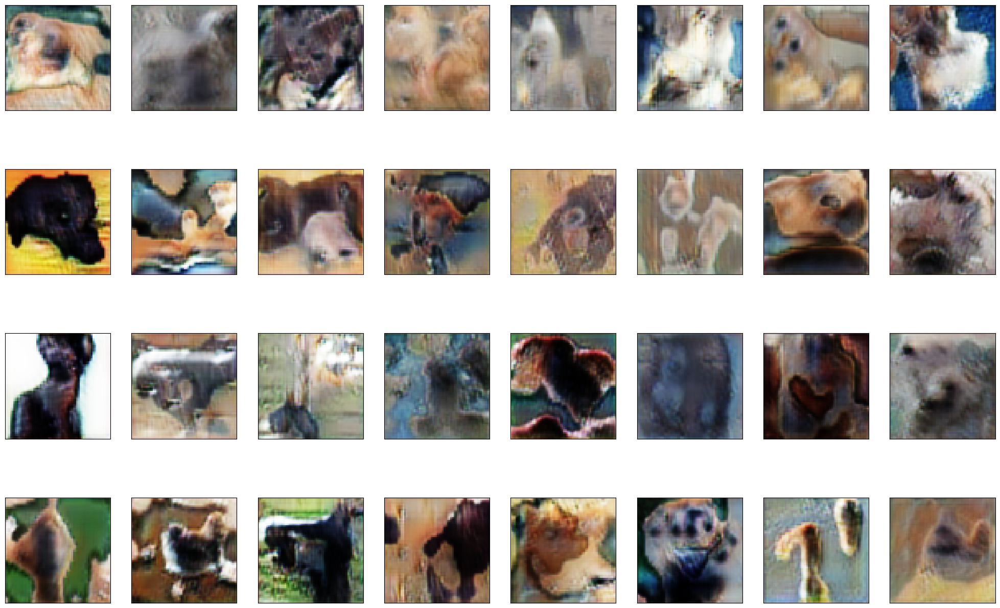

[20/200] D_loss = 1.021, G_loss = 1.320, elapsed_time = 45.8 min
epoch = 20


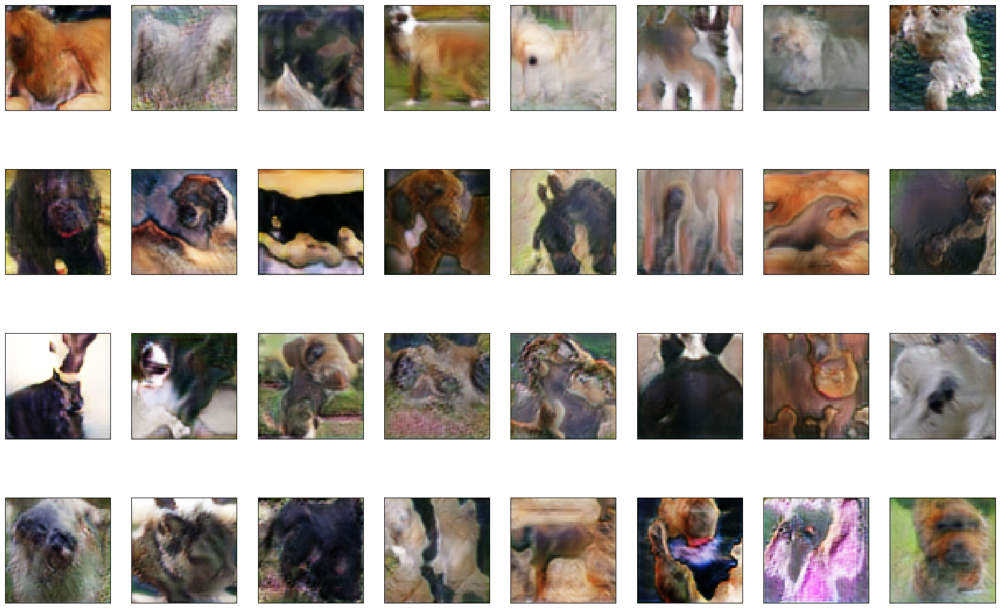

[30/200] D_loss = 0.988, G_loss = 1.416, elapsed_time = 66.1 min
epoch = 30


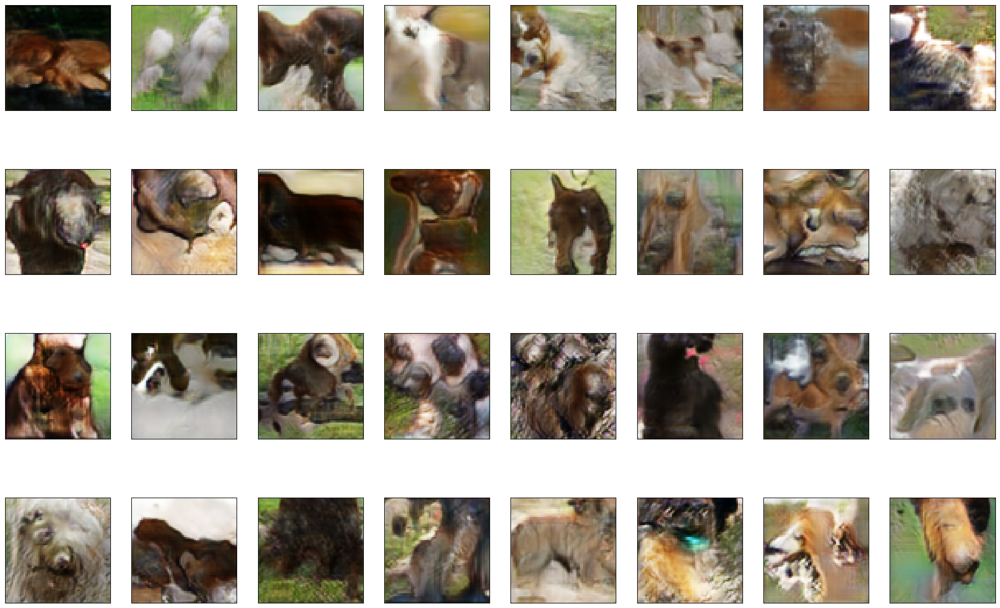

[40/200] D_loss = 0.958, G_loss = 1.493, elapsed_time = 86.3 min
epoch = 40


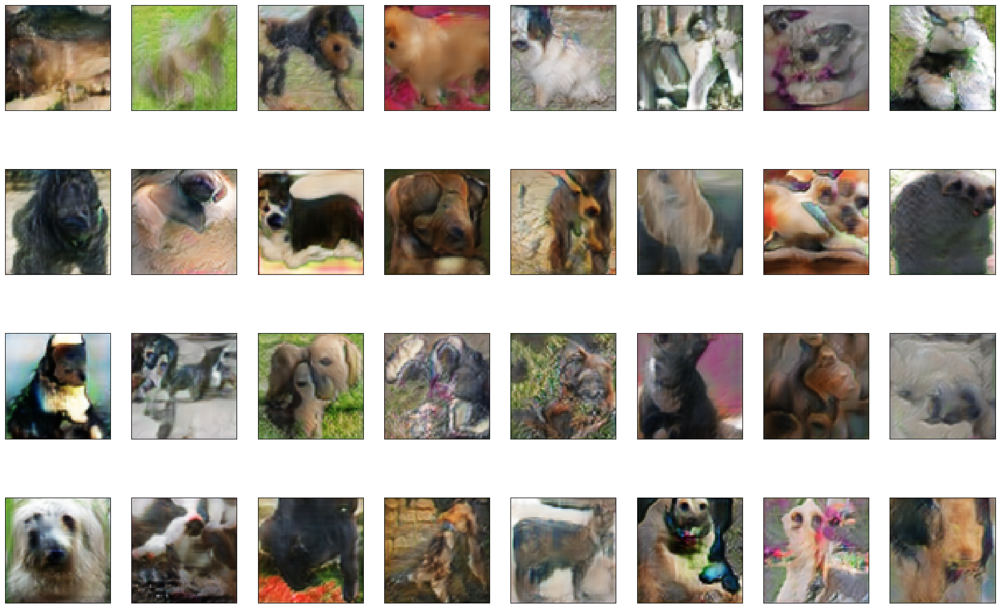

[50/200] D_loss = 0.943, G_loss = 1.550, elapsed_time = 106.6 min
epoch = 50


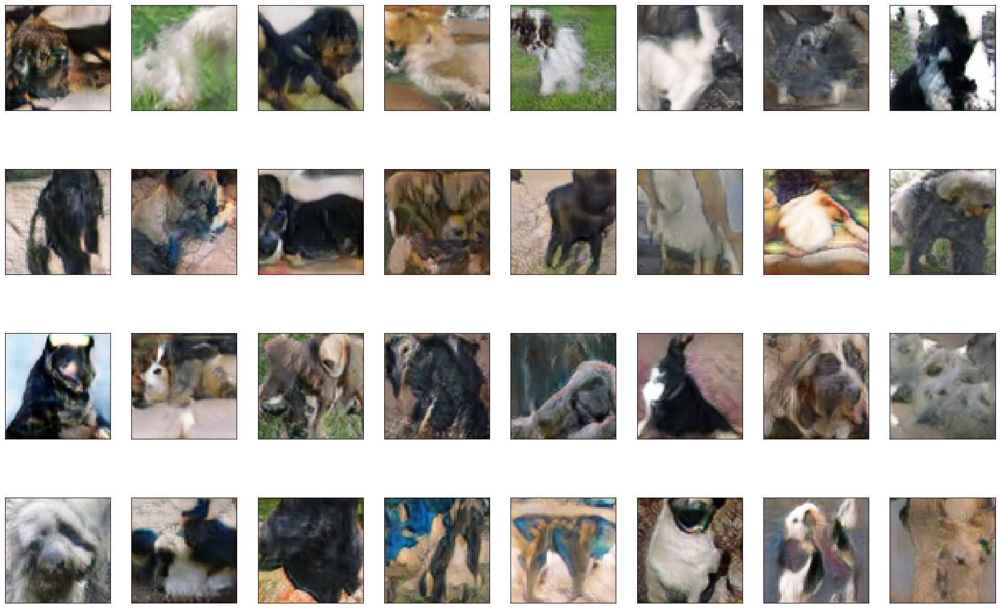

[60/200] D_loss = 0.925, G_loss = 1.601, elapsed_time = 126.7 min
epoch = 60


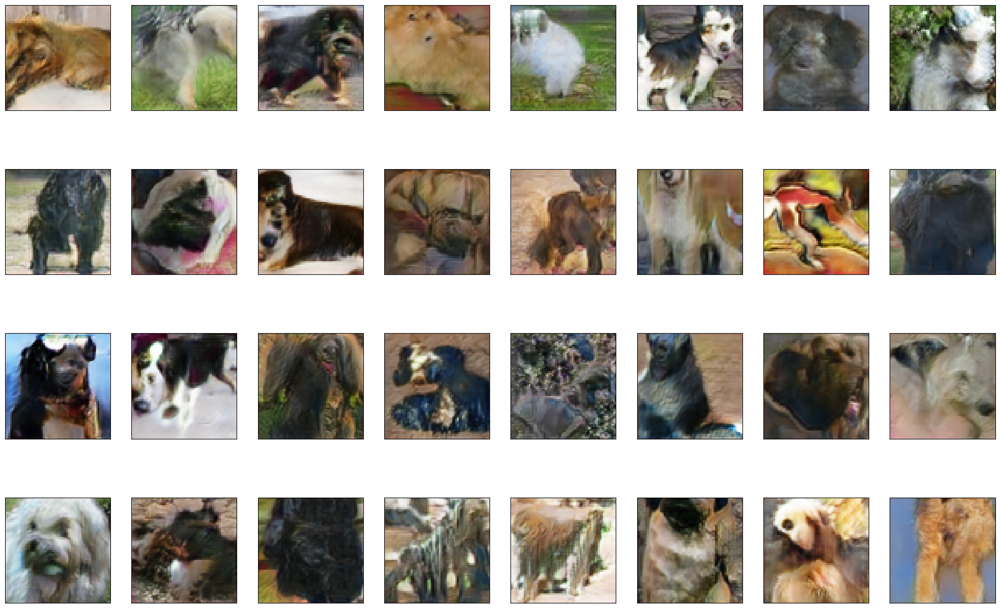

[70/200] D_loss = 0.917, G_loss = 1.644, elapsed_time = 146.9 min
epoch = 70


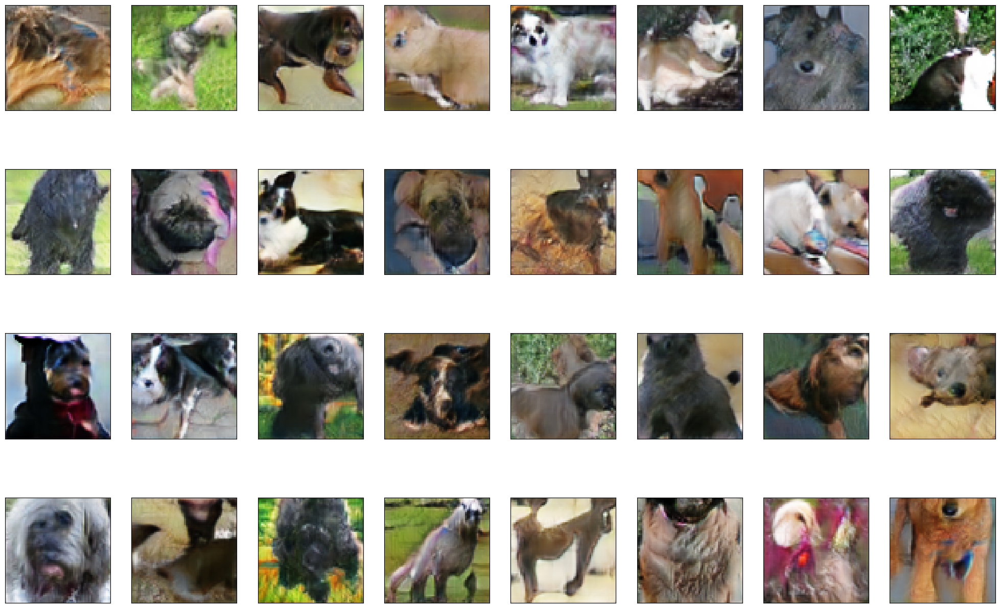

[80/200] D_loss = 0.909, G_loss = 1.667, elapsed_time = 167.0 min
epoch = 80


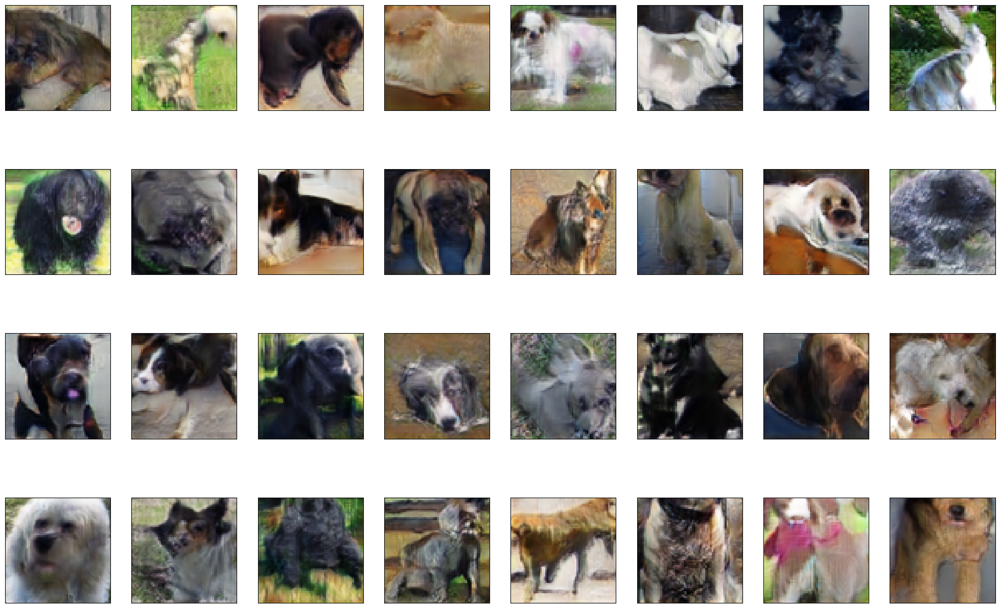

[90/200] D_loss = 0.896, G_loss = 1.711, elapsed_time = 187.2 min
epoch = 90


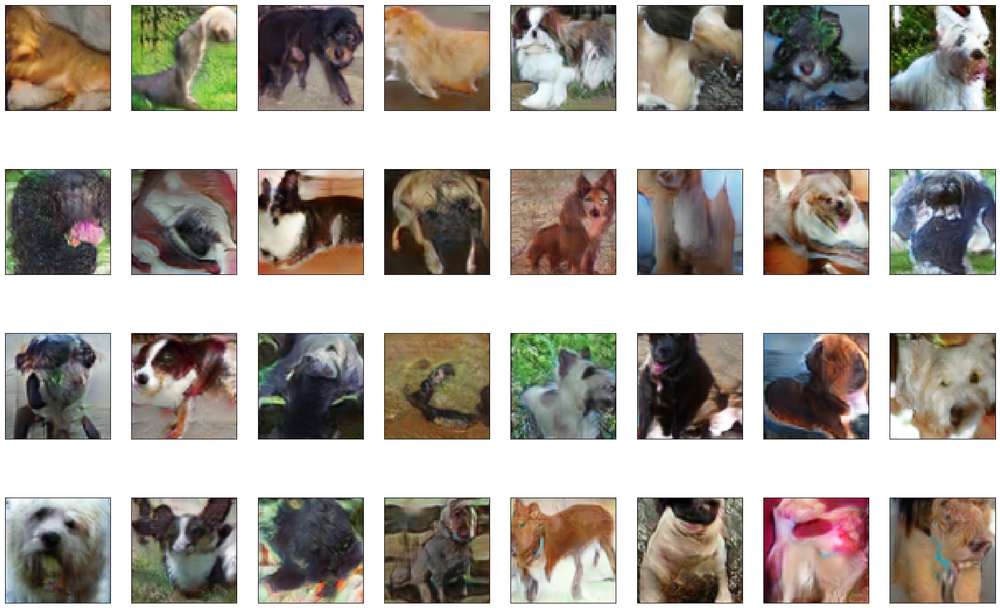

[100/200] D_loss = 0.872, G_loss = 1.803, elapsed_time = 207.5 min
epoch = 100


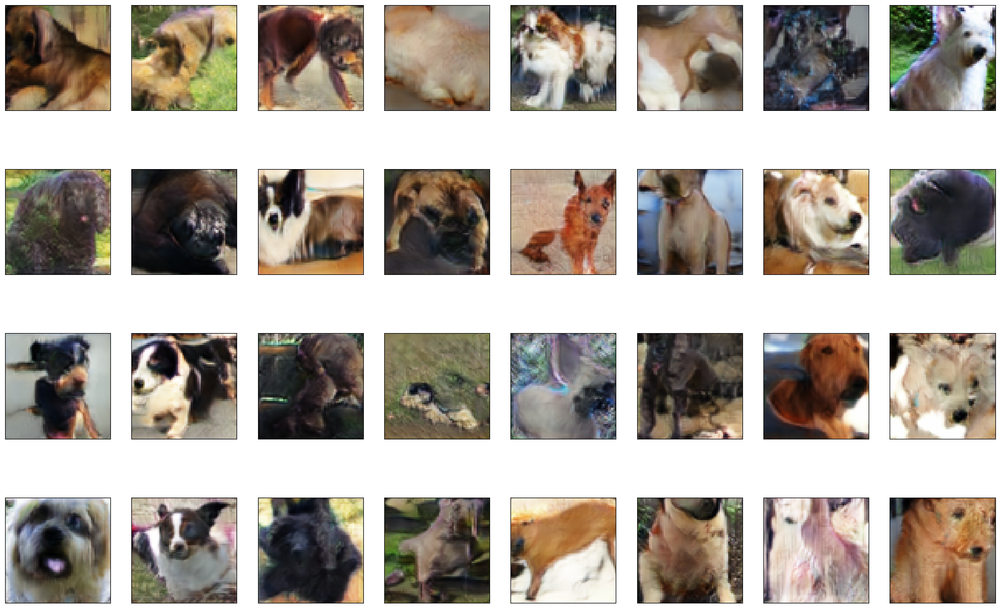

[110/200] D_loss = 0.843, G_loss = 1.860, elapsed_time = 227.7 min
epoch = 110


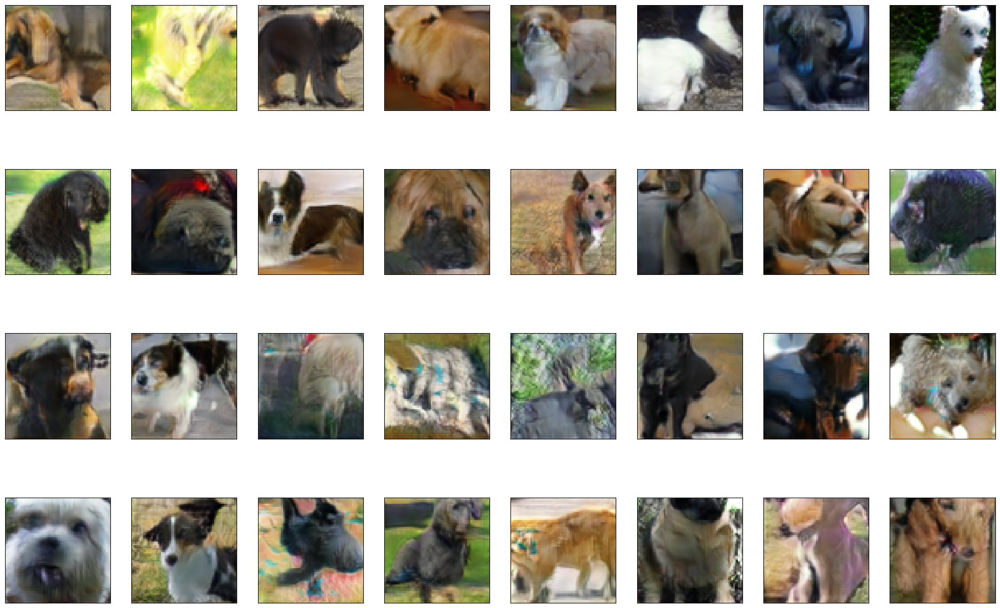

[120/200] D_loss = 0.815, G_loss = 1.966, elapsed_time = 247.9 min
epoch = 120


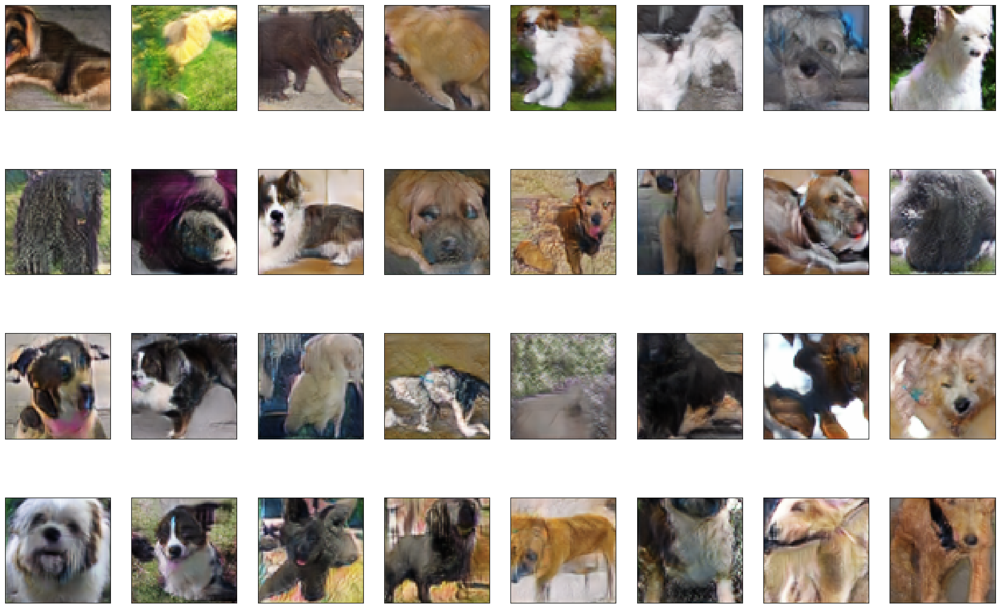

[130/200] D_loss = 0.788, G_loss = 2.051, elapsed_time = 268.0 min
epoch = 130


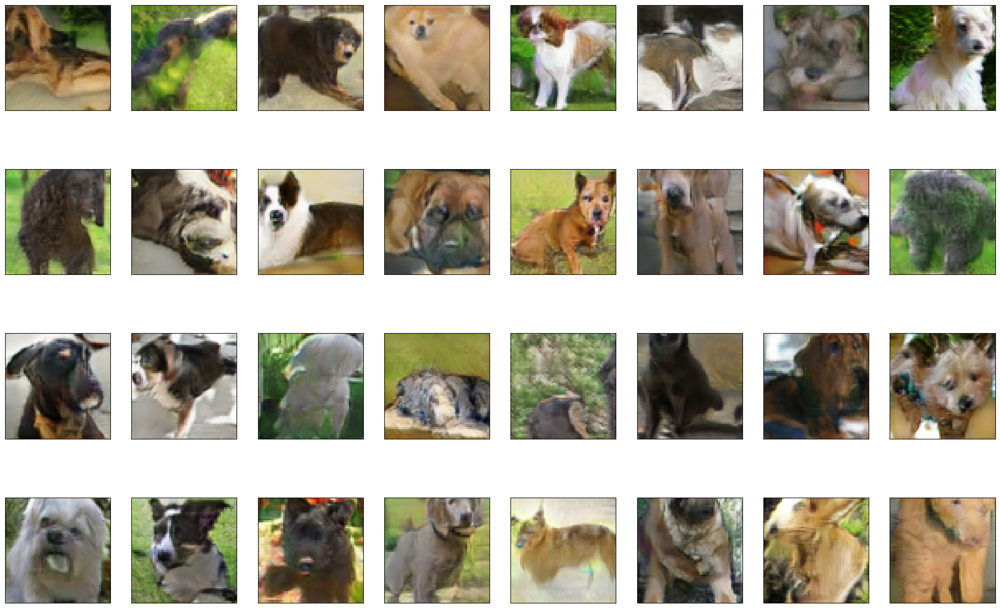

[140/200] D_loss = 0.765, G_loss = 2.143, elapsed_time = 288.1 min
epoch = 140


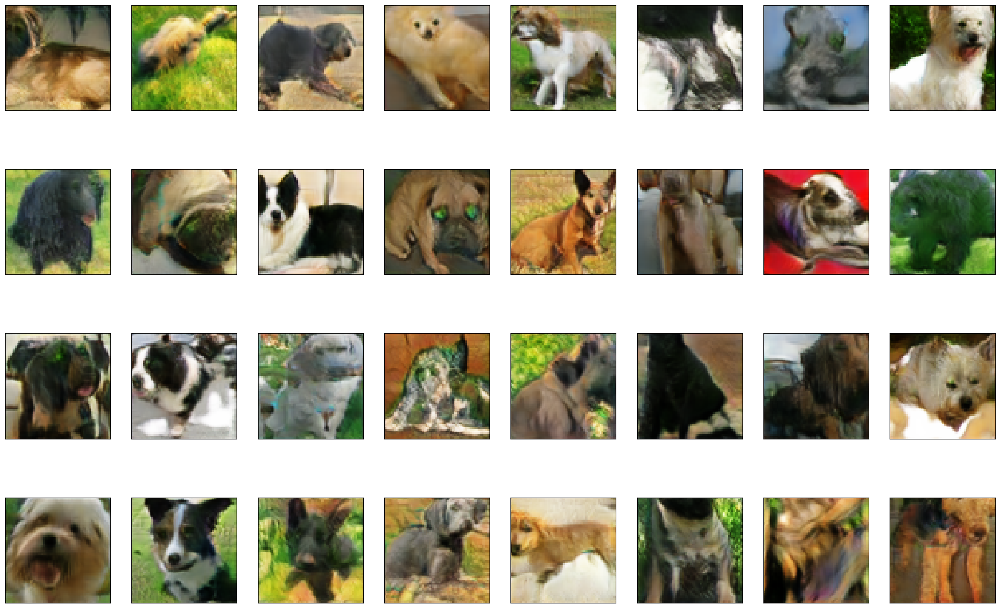

[150/200] D_loss = 0.735, G_loss = 2.251, elapsed_time = 308.2 min
epoch = 150


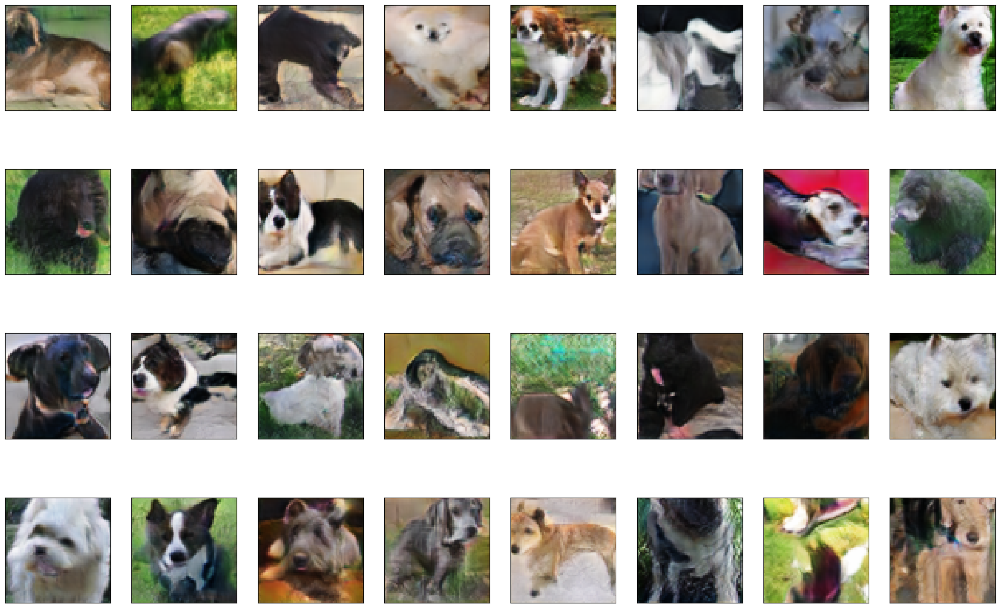

[160/200] D_loss = 0.715, G_loss = 2.319, elapsed_time = 328.3 min
epoch = 160


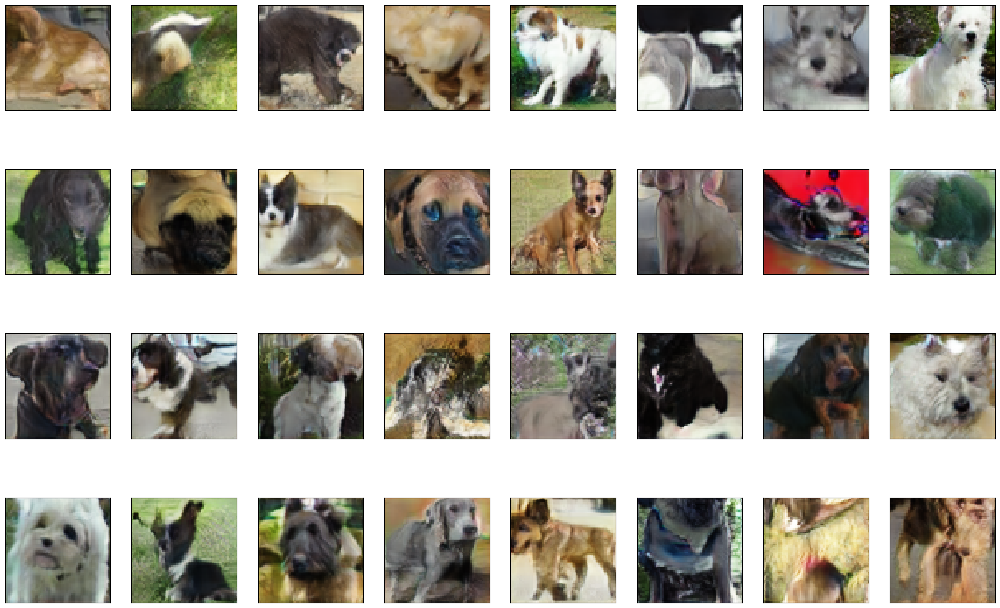

[170/200] D_loss = 0.693, G_loss = 2.430, elapsed_time = 348.4 min
epoch = 170


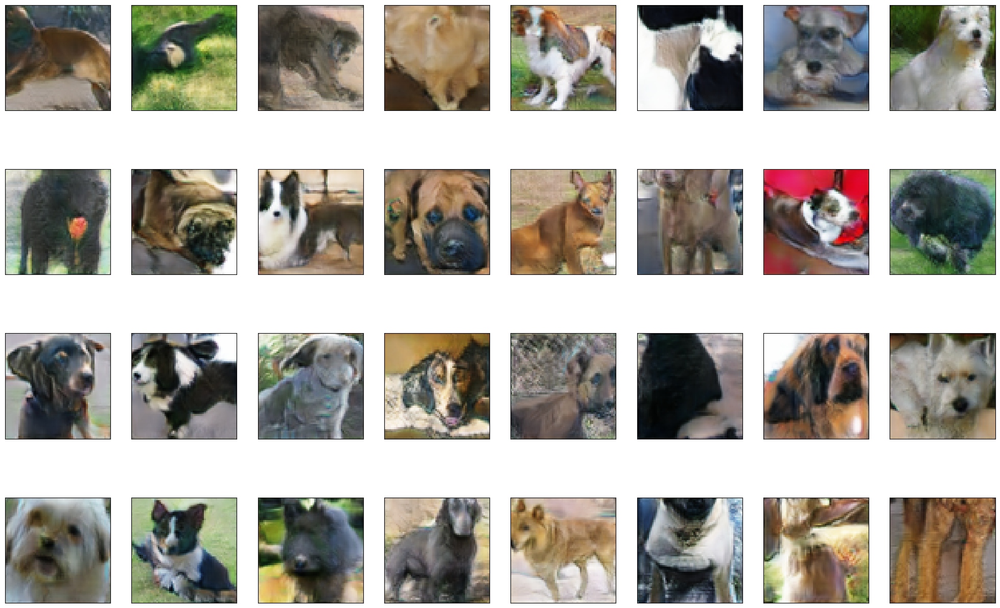

[180/200] D_loss = 0.670, G_loss = 2.518, elapsed_time = 368.5 min
epoch = 180


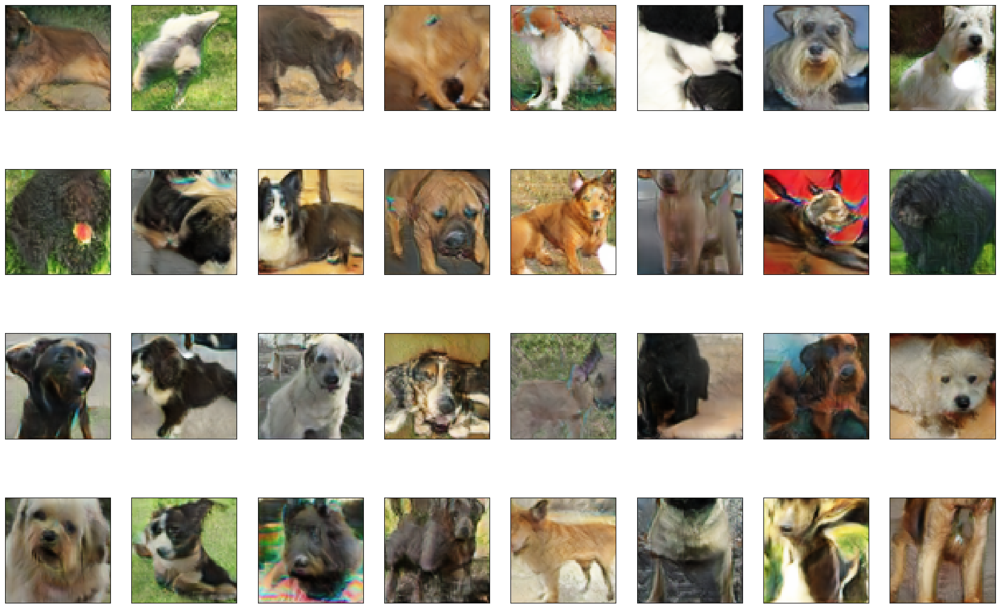

[190/200] D_loss = 0.653, G_loss = 2.593, elapsed_time = 388.6 min
epoch = 190


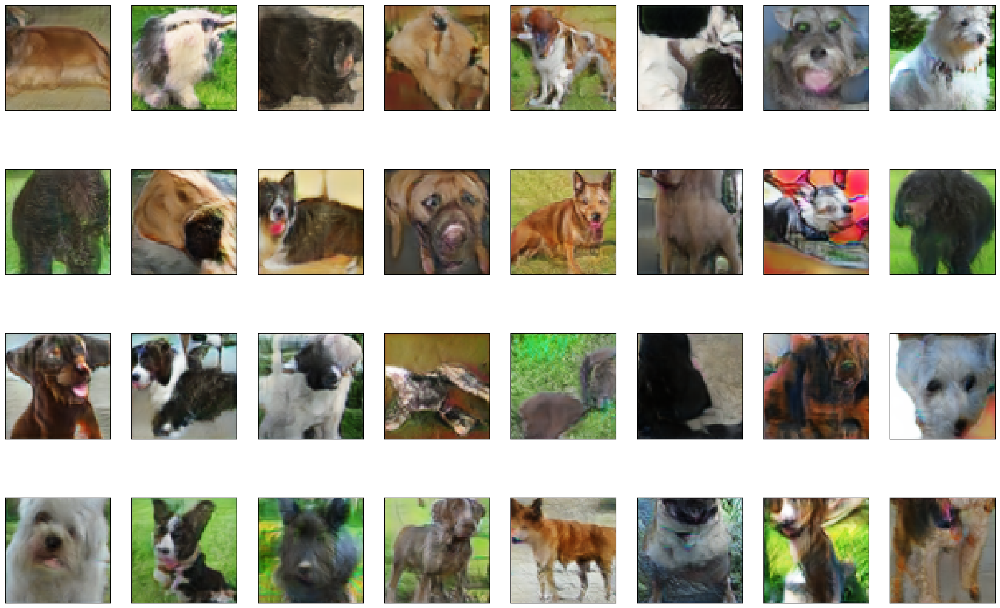

[200/200] D_loss = 0.637, G_loss = 2.680, elapsed_time = 408.7 min
epoch = 200


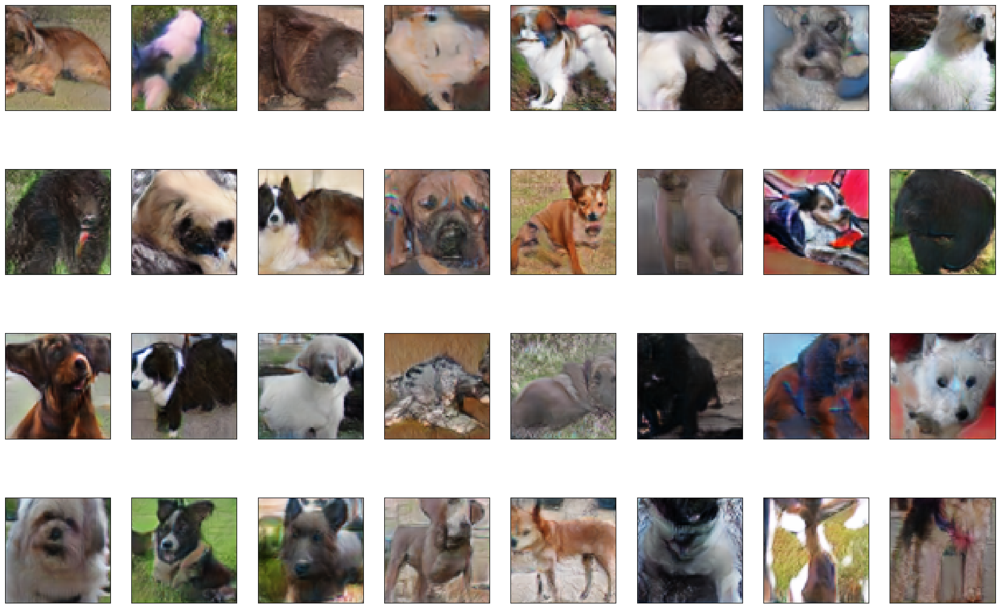

CPU times: user 6h 44min 36s, sys: 2min 45s, total: 6h 47min 22s
Wall time: 6h 43min 25s


In [27]:
%%time
#show_epoch_list = np.arange(0,100,1)
show_epoch_list = np.arange(0,500+10,10)

res = run(lr_G=3e-4,lr_D=3e-4, beta1=0.0, beta2=0.999, nz=120, epochs=200, 
          n_ite_D=1, ema_decay_rate=None, show_epoch_list=show_epoch_list, output_freq=10)
# res = run(lr_G=3e-4,lr_D=3e-4, beta1=0.5, beta2=0.999, nz=120, epochs=500, 
#           n_ite_D=1, ema_decay_rate=None, show_epoch_list=show_epoch_list, output_freq=10)

##### plt.plot(res['D_loss_list'], label='D_loss')
plt.plot(res['G_loss_list'], label='G_loss')
plt.grid()
plt.legend()
plt.title('loss history')

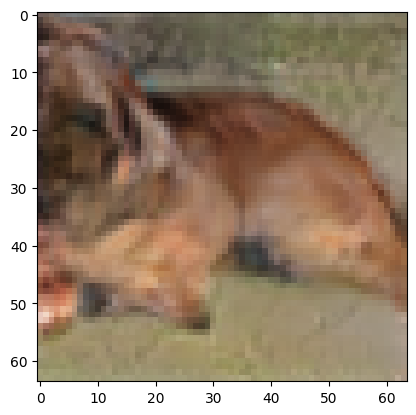

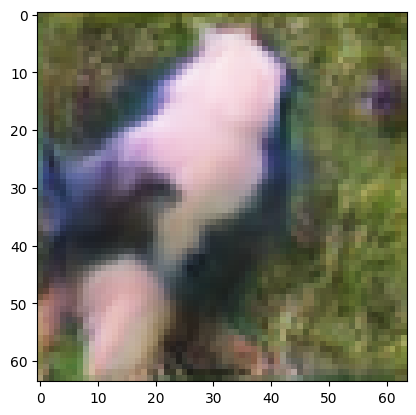

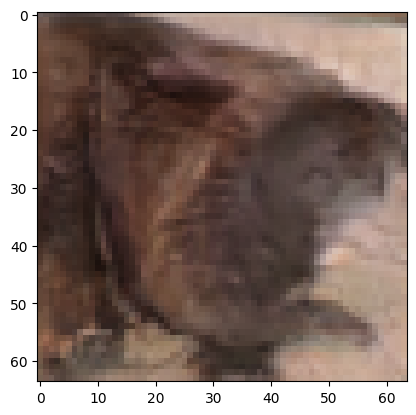

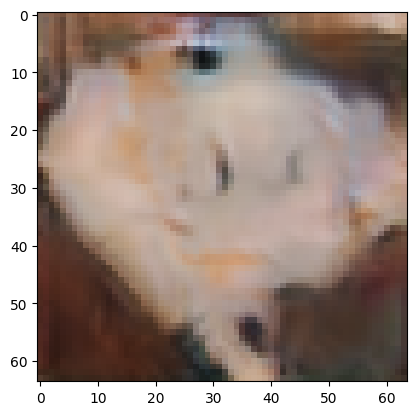

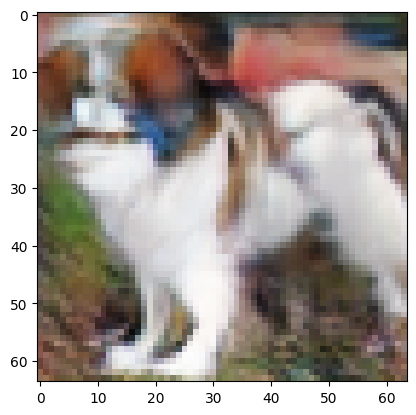

...

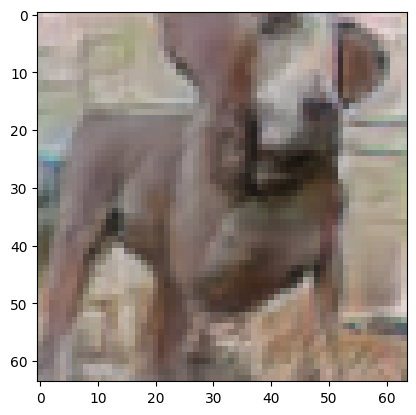

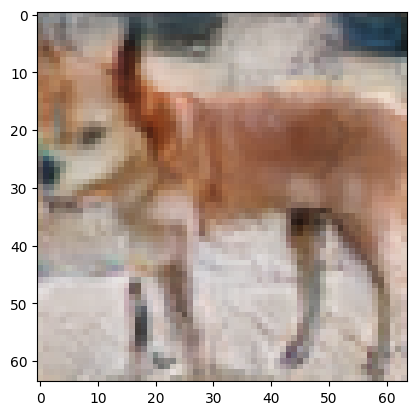

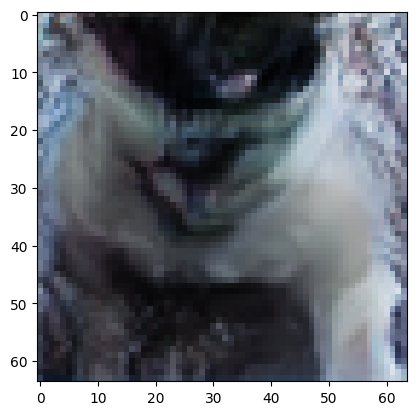

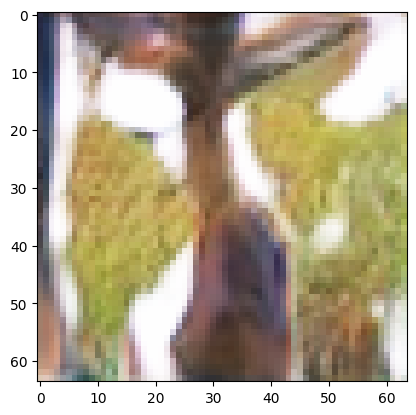

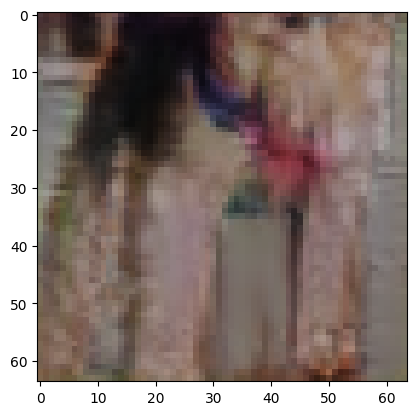

In [28]:
if not EMA:
    gen_image_numpy = generate_img(res['netG'],res['fixed_noise'],res['fixed_aux_labels_ohe'])
elif EMA:
    gen_image_numpy = generate_img(res['netG_EMA'],res['fixed_noise'],res['fixed_aux_labels_ohe'])
for img in gen_image_numpy:
    plt.imshow(img)
    plt.show()

In [1]:
#truncation_trick
def submission_generate_images(res, truncated=None):
    im_batch_size=50
    n_images=10000
    if not EMA:
        netG = res['netG']
    elif EMA:
        netG = res['netG_EMA']
    nz   = res['nz']
    if not os.path.exists('../output_images'):
        os.mkdir('../output_images')
    for i_batch in range(0, n_images, im_batch_size):
        if truncated is not None:
            flag = True
            while flag:
                z = np.random.randn(100*im_batch_size*nz)
                z = z[np.where(abs(z)<truncated)]
                if len(z)>=im_batch_size*nz:
                    flag=False
            gen_z = torch.from_numpy(z[:im_batch_size*nz]).view(im_batch_size,nz,1,1)
            gen_z = gen_z.float().to(device)
        else:
            gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
#         gen_z = gen_z / gen_z.norm(dim=1, keepdim=True)
        aux_labels     = np.random.randint(0,n_classes, im_batch_size)
        aux_labels_ohe = np.eye(n_classes)[aux_labels]
        aux_labels_ohe = torch.from_numpy(aux_labels_ohe[:,:,np.newaxis,np.newaxis])
        aux_labels_ohe = aux_labels_ohe.float().to(device)
        
        gen_images = netG(gen_z,aux_labels_ohe)
        gen_images = gen_images.to("cpu").clone().detach() #shape=(*,3,h,w), torch.Tensor
        #denormalize
        gen_images = gen_images*0.5 + 0.5
        for i_image in range(gen_images.size(0)):
            save_image(gen_images[i_image, :, :, :],
                       os.path.join(f'../output_images', f'image_{i_batch+i_image:05d}.png'))
    shutil.make_archive(f'images', 'zip', f'../output_images')

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import os
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
from torch.utils.data import Dataset, DataLoader
import os
from tqdm import tqdm_notebook as tqdm
from time import time
from PIL import Image
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.image as mpimg
import torchvision
import torchvision.datasets as dset
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import xml.etree.ElementTree as ET
import random
from torch.nn.utils import spectral_norm
from scipy.stats import truncnorm
import torch as th

batch_size = 32

In [ ]:
start = time()

In [ ]:
def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
seed_everything()

In [ ]:
class DataGenerator(Dataset):
    def __init__(self, directory, transform=None, n_samples=np.inf):
        self.directory = directory
        self.transform = transform
        self.n_samples = n_samples

        self.samples = self._load_subfolders_images(directory)
        if len(self.samples) == 0:
            raise RuntimeError("Found 0 files in subfolders of: {}".format(directory))

    def _load_subfolders_images(self, root):
        IMG_EXTENSIONS = (
        '.jpg', '.jpeg', '.png', '.ppm', '.bmp', '.pgm', '.tif', '.tiff', '.webp')

        def is_valid_file(x):
            return torchvision.datasets.folder.has_file_allowed_extension(x, IMG_EXTENSIONS)

        required_transforms = torchvision.transforms.Compose([
                torchvision.transforms.Resize(64),
                torchvision.transforms.CenterCrop(64),
        ])

        imgs = []
        paths = []
        for root, _, fnames in sorted(os.walk(root)):
            for fname in sorted(fnames)[:min(self.n_samples, 999999999999999)]:
                path = os.path.join(root, fname)
                paths.append(path)

        for path in paths:
            if is_valid_file(path):
                # Load image
                img = dset.folder.default_loader(path)

                # Get bounding boxes
                annotation_basename = os.path.splitext(os.path.basename(path))[0]
                annotation_dirname = next(
                        dirname for dirname in os.listdir('../input/stanford-dog-dataset/Annotation/Annotation/') if
                        dirname.startswith(annotation_basename.split('_')[0]))
                annotation_filename = os.path.join('../input/stanford-dog-dataset/Annotation/Annotation/',
                                                   annotation_dirname, annotation_basename)
                tree = ET.parse(annotation_filename)
                root = tree.getroot()
                objects = root.findall('object')
                for o in objects:
                    bndbox = o.find('bndbox')
                    xmin = int(bndbox.find('xmin').text)
                    ymin = int(bndbox.find('ymin').text)
                    xmax = int(bndbox.find('xmax').text)
                    ymax = int(bndbox.find('ymax').text)
                    
                    w = np.min((xmax - xmin, ymax - ymin))
                    bbox = (xmin, ymin, xmin+w, ymin+w)
                    object_img = required_transforms(img.crop(bbox))
                    #object_img = object_img.resize((64,64), Image.ANTIALIAS)
                    imgs.append(object_img)
        return imgs

    def __getitem__(self, index):
        sample = self.samples[index]
        
        if self.transform is not None:
            sample = self.transform(sample)
            
        return np.asarray(sample)
    
    def __len__(self):
        return len(self.samples)

In [ ]:
%%time
database = '../input/stanford-dog-dataset/all-dogs/all-dogs/'

transform = transforms.Compose([transforms.RandomHorizontalFlip(p=0.3),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = DataGenerator(database, transform=transform,n_samples=25000)


train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,batch_size=batch_size, num_workers = 4)

In [ ]:
# ----------------------------------------------------------------------------
# Pixelwise feature vector normalization.
# reference: https://github.com/tkarras/progressive_growing_of_gans/blob/master/networks.py#L120
# ----------------------------------------------------------------------------
class PixelwiseNorm(nn.Module):
    def __init__(self):
        super(PixelwiseNorm, self).__init__()

    def forward(self, x, alpha=1e-8):
        """
        forward pass of the module
        :param x: input activations volume
        :param alpha: small number for numerical stability
        :return: y => pixel normalized activations
        """
        y = x.pow(2.).mean(dim=1, keepdim=True).add(alpha).sqrt()  # [N1HW]
        y = x / y  # normalize the input x volume
        return y

In [ ]:
def show_generated_img_all():
    gen_z = torch.randn(32, nz, 1, 1, device=device)
    gen_images = netG(gen_z).to("cpu").clone().detach()
    gen_images = gen_images.numpy().transpose(0, 2, 3, 1)
    gen_images = (gen_images+1.0)/2.0
    fig = plt.figure(figsize=(25, 16))
    for ii, img in enumerate(gen_images):
        ax = fig.add_subplot(4, 8, ii + 1, xticks=[], yticks=[])
        plt.imshow(img)
    #plt.savefig(filename) 
    

In [ ]:
### This is to show one sample image for iteration of chosing
def show_generated_img():
    noise = torch.randn(1, nz, 1, 1, device=device)
    gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
    gen_image = gen_image.numpy().transpose(1, 2, 0)
    gen_image = ((gen_image+1.0)/2.0)
    plt.imshow(gen_image)
    plt.show()

In [ ]:
class MinibatchStdDev(th.nn.Module):
    """
    Minibatch standard deviation layer for the discriminator
    """

    def __init__(self):
        """
        derived class constructor
        """
        super(MinibatchStdDev, self).__init__()

    def forward(self, x, alpha=1e-8):
        """
        forward pass of the layer
        :param x: input activation volume
        :param alpha: small number for numerical stability
        :return: y => x appended with standard deviation constant map
        """
        batch_size, _, height, width = x.shape
        # [B x C x H x W] Subtract mean over batch.
        y = x - x.mean(dim=0, keepdim=True)
        # [1 x C x H x W]  Calc standard deviation over batch
        y = th.sqrt(y.pow(2.).mean(dim=0, keepdim=False) + alpha)

        # [1]  Take average over feature_maps and pixels.
        y = y.mean().view(1, 1, 1, 1)

        # [B x 1 x H x W]  Replicate over group and pixels.
        y = y.repeat(batch_size,1, height, width)

        # [B x C x H x W]  Append as new feature_map.
        y = th.cat([x, y], 1)
        # return the computed values:
        return y

In [ ]:
class Generator(nn.Module):
    def __init__(self, nz, nfeats, nchannels):
        super(Generator, self).__init__()

        # input is Z, going into a convolution
        self.conv1 = spectral_norm(nn.ConvTranspose2d(nz, nfeats * 8, 4, 1, 0, bias=False))
        #self.bn1 = nn.BatchNorm2d(nfeats * 8)
        # state size. (nfeats*8) x 4 x 4
        
        self.conv2 = spectral_norm(nn.ConvTranspose2d(nfeats * 8, nfeats * 8, 4, 2, 1, bias=False))
        #self.bn2 = nn.BatchNorm2d(nfeats * 8)
        # state size. (nfeats*8) x 8 x 8
        
        self.conv3 = spectral_norm(nn.ConvTranspose2d(nfeats * 8, nfeats * 4, 4, 2, 1, bias=False))
        #self.bn3 = nn.BatchNorm2d(nfeats * 4)
        # state size. (nfeats*4) x 16 x 16
        
        self.conv4 = spectral_norm(nn.ConvTranspose2d(nfeats * 4, nfeats * 2, 4, 2, 1, bias=False))
        #self.bn4 = nn.BatchNorm2d(nfeats * 2)
        # state size. (nfeats * 2) x 32 x 32
        
        self.conv5 = spectral_norm(nn.ConvTranspose2d(nfeats * 2, nfeats, 4, 2, 1, bias=False))
        #self.bn5 = nn.BatchNorm2d(nfeats)
        # state size. (nfeats) x 64 x 64
        
        self.conv6 = spectral_norm(nn.ConvTranspose2d(nfeats, nchannels, 3, 1, 1, bias=False))
        # state size. (nchannels) x 64 x 64
        self.pixnorm = PixelwiseNorm()
    def forward(self, x):
        #x = F.leaky_relu(self.bn1(self.conv1(x)))
        #x = F.leaky_relu(self.bn2(self.conv2(x)))
        #x = F.leaky_relu(self.bn3(self.conv3(x)))
        #x = F.leaky_relu(self.bn4(self.conv4(x)))
        #x = F.leaky_relu(self.bn5(self.conv5(x)))
        x = F.leaky_relu(self.conv1(x))
        x = F.leaky_relu(self.conv2(x))
        x = self.pixnorm(x)
        x = F.leaky_relu(self.conv3(x))
        x = self.pixnorm(x)
        x = F.leaky_relu(self.conv4(x))
        x = self.pixnorm(x)
        x = F.leaky_relu(self.conv5(x))
        x = self.pixnorm(x)
        x = torch.tanh(self.conv6(x))
        
        return x



class Discriminator(nn.Module):
    def __init__(self, nchannels, nfeats):
        super(Discriminator, self).__init__()

        # input is (nchannels) x 64 x 64
        self.conv1 = nn.Conv2d(nchannels, nfeats, 4, 2, 1, bias=False)
        # state size. (nfeats) x 32 x 32
        
        self.conv2 = spectral_norm(nn.Conv2d(nfeats, nfeats * 2, 4, 2, 1, bias=False))
        self.bn2 = nn.BatchNorm2d(nfeats * 2)
        # state size. (nfeats*2) x 16 x 16
        
        self.conv3 = spectral_norm(nn.Conv2d(nfeats * 2, nfeats * 4, 4, 2, 1, bias=False))
        self.bn3 = nn.BatchNorm2d(nfeats * 4)
        # state size. (nfeats*4) x 8 x 8
       
        self.conv4 = spectral_norm(nn.Conv2d(nfeats * 4, nfeats * 8, 4, 2, 1, bias=False))
        self.bn4 = nn.MaxPool2d(2)
        # state size. (nfeats*8) x 4 x 4
        self.batch_discriminator = MinibatchStdDev()
        self.pixnorm = PixelwiseNorm()
        self.conv5 = spectral_norm(nn.Conv2d(nfeats * 8 +1, 1, 2, 1, 0, bias=False))
        # state size. 1 x 1 x 1
        
    def forward(self, x):
        x = F.leaky_relu(self.conv1(x), 0.2)
        x = F.leaky_relu(self.bn2(self.conv2(x)), 0.2)
       # x = self.pixnorm(x)
        x = F.leaky_relu(self.bn3(self.conv3(x)), 0.2)
       # x = self.pixnorm(x)
        x = F.leaky_relu(self.bn4(self.conv4(x)), 0.2)
       # x = self.pixnorm(x)
        x = self.batch_discriminator(x)
        x = torch.sigmoid(self.conv5(x))
        #x= self.conv5(x)
        return x.view(-1, 1)


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

lr = 0.0002
lr_d = 0.0002
beta1 = 0.5
epochs = 1000
netG = Generator(100, 32, 3).to(device)
netD = Discriminator(3, 48).to(device)

criterion = nn.BCELoss()
#criterion = nn.MSELoss()

optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr_d, betas=(beta1, 0.999))
lr_schedulerG = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizerG,
                                                                     T_0=epochs//200, eta_min=0.00005)
lr_schedulerD = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizerD,
                                                                     T_0=epochs//200, eta_min=0.00005)

nz = 100
fixed_noise = torch.randn(25, nz, 1, 1, device=device)

real_label = 0.7
fake_label = 0.0
batch_size = train_loader.batch_size



### training here


step = 0
for epoch in range(epochs):
    for ii, (real_images) in tqdm(enumerate(train_loader), total=len(train_loader)):
        end = time()
        if (end -start) > 25000 :
            break
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device) +  np.random.uniform(-0.1, 0.1)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label) + np.random.uniform(0, 0.2)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        if step % 500 == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
            valid_image = netG(fixed_noise)
        step += 1
        lr_schedulerG.step(epoch)
        lr_schedulerD.step(epoch)

    if epoch % 100 == 0:
        show_generated_img()
        
# torch.save(netG.state_dict(), 'generator.pth')
# torch.save(netD.state_dict(), 'discriminator.pth')

def truncated_normal(size, threshold=1):
    values = truncnorm.rvs(-threshold, threshold, size=size)
    return values

if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
im_batch_size = 100
n_images=100
for i_batch in range(0, n_images, im_batch_size):
    z = truncated_normal((im_batch_size, 100, 1, 1), threshold=1)
    gen_z = torch.from_numpy(z).float().to(device)    
    #gen_z = torch.randn(im_batch_size, 100, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image((gen_images[i_image, :, :, :] +1.0)/2.0, os.path.join('../output_images', f'image_{i_batch+i_image:05d}.png'))


import shutil
shutil.make_archive('images', 'zip', '../output_images')